In [2]:
import warnings
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import shap
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler, RobustScaler, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor, VotingClassifier, RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import GridSearchCV, cross_validate, cross_val_predict, train_test_split, validation_curve
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.neighbors import KNeighborsClassifier, LocalOutlierFactor
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, export_graphviz, export_text
from imblearn.under_sampling import RandomUnderSampler
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import joblib

warnings.simplefilter(action='ignore', category=Warning)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', 500)

In [3]:
################################################
# 1. Exploratory Data Analysis Functions
################################################

def check_df(dataframe, head=5):
    print("##################### Shape #####################")
    print(dataframe.shape)
    print("##################### Types #####################")
    print(dataframe.dtypes)
    print("##################### Head #####################")
    print(dataframe.head(head))
    print("##################### Tail #####################")
    print(dataframe.tail(head))
    print("##################### NA #####################")
    print(dataframe.isnull().sum())

    print("##################### Non-numeric columns #####################")
    non_numeric_columns = dataframe.select_dtypes(exclude=['number']).columns
    print(non_numeric_columns)

    print("##################### Quantiles #####################")
    numeric_df = dataframe.select_dtypes(include=['number'])  # Sadece sayısal sütunları seçer
    print(numeric_df.quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)

def cat_summary(dataframe, col_name, plot=False):
    print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                        "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)}))
    print("##########################################")
    if plot:
        sns.countplot(x=dataframe[col_name], data=dataframe)
        plt.show(block=True)

def num_summary(dataframe, numerical_col, plot=False):
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    print(dataframe[numerical_col].describe(quantiles).T)

    if plot:
        dataframe[numerical_col].hist(bins=20)
        plt.xlabel(numerical_col)
        plt.title(numerical_col)
        plt.show(block=True)
    print('#####################################################')
    
def target_summary_with_num(dataframe, target, numerical_col):
    print(dataframe.groupby(target).agg({numerical_col: "mean"}), end="\n\n\n")

def target_summary_with_cat(dataframe, target, categorical_col):
    print(pd.DataFrame({"TARGET_MEAN": dataframe.groupby(categorical_col)[target].mean()}), end="\n\n\n")

def grab_col_names(dataframe, cat_th=10, car_th=20):
    """
    Gives the names of categorical, numeric and categorical but cardinal variables in the data set.
    
    Note: Categorical variables with numeric appearance are also included in categorical variables.
    
    Parameters
    ------
    dataframe: dataframe
    Dataframe to get variable names
    cat_th: int, optional
    Class threshold value for numeric but categorical variables
    car_th: int, optional
    Class threshold value for categorical but cardinal variables
    
    Returns
    ------
    cat_cols: list
    Categorical variable list
    num_cols: list
    Numeric variable list
    cat_but_car: list
    Cardinal variable list with categorical appearance
    
    Examples
    ------
    import seaborn as sns
    df = sns.load_dataset("iris")
    print(grab_col_names(df))
    
    Notes
    ------
    cat_cols + num_cols + cat_but_car = total number of variables
    num_but_cat inside cat_cols.
    The total of the 3 lists returned is equal to the total number of variables: cat_cols + num_cols + cat_but_car = number of variables

    """

    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    # print(f"Observations: {dataframe.shape[0]}")
    # print(f"Variables: {dataframe.shape[1]}")
    # print(f'cat_cols: {len(cat_cols)}')
    # print(f'num_cols: {len(num_cols)}')
    # print(f'cat_but_car: {len(cat_but_car)}')
    # print(f'num_but_cat: {len(num_but_cat)}')
    return cat_cols, num_cols, cat_but_car

def high_correlated_cols(dataframe, plot=False, corr_th=0.90):
    corr = dataframe.corr()
    cor_matrix = corr.abs()
    upper_triangle_matrix = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))
    drop_list = [col for col in upper_triangle_matrix.columns if any(upper_triangle_matrix[col] > corr_th)]
    if plot:
        #sns.set(rc={'figure.figsize': (15, 15)})
        #sns.heatmap(corr, cmap="RdBu")
        #plt.show()
        
        fig = plt.gcf()
        fig.set_size_inches(14, 14)
        plt.xticks(fontsize=9)
        plt.yticks(fontsize=9)
        fig = sns.heatmap(dataframe.corr(), annot=True, linewidths=0.5, annot_kws={'size': 9}, linecolor='w', cmap='RdBu', fmt=".2f")
        plt.show(block=True)
    return drop_list


In [4]:
################################################
# 2. Data Preprocessing & Feature Engineering Functions
################################################

def outlier_thresholds(dataframe, col_name, q1=0.05, q3=0.95):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

#def check_outlier(dataframe, col_name, q1=0.05, q3=0.95):
#    low_limit, up_limit = outlier_thresholds(dataframe, col_name, q1, q3)
#    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
#        return True
#    else:
#        return False

def check_outlier(dataframe, col_name, q1=0.05, q3=0.95):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name, q1, q3)
    outliers = (dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)
    return outliers.any()

def missing_values_table(dataframe, na_name=False):
    na_columns = [col for col in dataframe.columns if dataframe[col].isnull().sum() > 0]

    n_miss = dataframe[na_columns].isnull().sum().sort_values(ascending=False)
    ratio = (dataframe[na_columns].isnull().sum() / dataframe.shape[0] * 100).sort_values(ascending=False)
    missing_df = pd.concat([n_miss, np.round(ratio, 2)], axis=1, keys=['n_miss', 'ratio'])
    print(missing_df, end="\n")

    if na_name:
        return na_columns
    
def missing_vs_target(dataframe, target, na_columns):
    temp_df = dataframe.copy()

    for col in na_columns:
        temp_df[col + '_NA_FLAG'] = np.where(temp_df[col].isnull(), 1, 0)

    na_flags = temp_df.loc[:, temp_df.columns.str.contains("_NA_")].columns

    for col in na_flags:
        print(pd.DataFrame({"TARGET_MEAN": temp_df.groupby(col)[target].mean(),
                            "Count": temp_df.groupby(col)[target].count()}), end="\n\n\n")
        
def optimize_dtypes(df):
    for column in df.columns:
        if df[column].dtype == 'int64':
            df[column] = df[column].astype('int32')
        elif df[column].dtype == 'float64':
            df[column] = df[column].astype('float32')
    return df

def one_hot_encoder(dataframe, categorical_cols, drop_first=False):
    # One-Hot Encoding işlemi
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
    
    # Yeni oluşturulan sütunları `int` veri tipine dönüştürme
    for col in dataframe.columns:
        if dataframe[col].dtype == 'bool':
            dataframe[col] = dataframe[col].astype(int)
    
    return dataframe

def calculate_cutoffs_for_each_feature(data, feature_columns, target_column):
    """
   Trains logistic regression model for each feature column separately, calculates ROC curve and returns best cutoff points.
    
    Parameters:
    data (DataFrame): Dataset
    feature_columns (list): Names of feature columns
    target_column (str): Name of target column
    
    Returns:
    dict: A dictionary containing best cutoff points and ROC AUC scores for each feature
    """
    results = {}

    for feature in feature_columns:
        X = data[[feature]].values
        y = data[target_column].values

        model = LogisticRegression()
        model.fit(X, y)

        y_probs = model.predict_proba(X)[:, 1]

        fpr, tpr, thresholds = roc_curve(y, y_probs)
        auc = roc_auc_score(y, y_probs)

        J_scores = tpr - fpr
        best_cutoff = thresholds[np.argmax(J_scores)]

        results[feature] = {'best_cutoff': best_cutoff, 'roc_auc': auc}

    return results
#def one_hot_encoder(dataframe, categorical_cols, drop_first=False):
#    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
#    return dataframe

In [5]:
# Functions that used to extracting lab results
def extract_lab_result(lab_result, test_name):
    match = re.search(rf'{test_name}\s*([\d.]+)', lab_result)
    if match:
        value = match.group(1)
        try:
            return float(value)
        except ValueError:
            return None
    return None

In [6]:
# # cat_lab_tests
# def categorize_tests(test_names, categories):
#     categorized_tests = {category: [] for category in categories}
#     for test in test_names:
#         for category, tests in categories.items():
#             if test in tests:
#                 categorized_tests[category].append(test)
#     return categorized_tests

In [7]:
# Lab results that we need
test_names = ['NEU#', 'LYM#', 'MON#', 'PLT', 'CRP', 'HGB', 'HCT', 'BUN', 'KREATININ', 'KLOR', 'SODYUM', 'POTASYUM', 'KALSIYUM', 'EOS#', 'FHHB', 'SO2', 'WBC']

In [8]:
################################################
# 1. Exploratory Data Analysis
################################################

In [9]:
df = pd.read_csv('ClinicalLabResults.csv')
df.head()

,Unnamed: 0,AGE,GENDER,DIAGNOSIS,DIAGNOSISCODE,LABRESULTS
0,4,29.0,KADIN,Demir eksikliği anemisi -,D50 -,pH 5 - Ürobilinojen norm - Keton neg - Kristal...
1,9,33.0,KADIN,Gelişimsel over kisti -,Q50.1 -,Beta-hCG 0.843 - WBC 8.9 - RBC 4.56 - HCT 40.3...
2,10,80.0,ERKEK,"Nefes almayı tehdit eden nedenler, tanımlanmam...",W84 -,ALT 11 - AST 29 - CRP 2.9 - WBC 14.6 - RBC 5.3...
3,12,78.0,ERKEK,"Astım, allerjik -",J45.0 -,ALT 5 - AST 13 - CRP 13.2 - WBC 9.8 - RBC 3.81...
4,15,52.0,ERKEK,"Pnömoni, tanımlanmamış - Gastro-özofajial refl...",J18.9 - K21.9 - R63.4 -,ALT 14 - Albümin (Desilitre) 3.6 - Alkalen fos...


In [10]:
df['AGE'] = df['AGE'].astype(int)

In [11]:
# Pnömoni sütunu olusturma
df['DIAGNOSISCODE'] = df['DIAGNOSISCODE'].astype(str)
df['PNOMONI'] = df['DIAGNOSISCODE'].apply(lambda x: 1 if 'J18.9' in str(x) else 0)

In [12]:
df.head()

,Unnamed: 0,AGE,GENDER,DIAGNOSIS,DIAGNOSISCODE,LABRESULTS,PNOMONI
0,4,29,KADIN,Demir eksikliği anemisi -,D50 -,pH 5 - Ürobilinojen norm - Keton neg - Kristal...,0
1,9,33,KADIN,Gelişimsel over kisti -,Q50.1 -,Beta-hCG 0.843 - WBC 8.9 - RBC 4.56 - HCT 40.3...,0
2,10,80,ERKEK,"Nefes almayı tehdit eden nedenler, tanımlanmam...",W84 -,ALT 11 - AST 29 - CRP 2.9 - WBC 14.6 - RBC 5.3...,0
3,12,78,ERKEK,"Astım, allerjik -",J45.0 -,ALT 5 - AST 13 - CRP 13.2 - WBC 9.8 - RBC 3.81...,0
4,15,52,ERKEK,"Pnömoni, tanımlanmamış - Gastro-özofajial refl...",J18.9 - K21.9 - R63.4 -,ALT 14 - Albümin (Desilitre) 3.6 - Alkalen fos...,1


In [13]:
value_counts = df['PNOMONI'].value_counts()
value_ratios = df['PNOMONI'].value_counts(normalize=True) * 100
pd.DataFrame({'Count': value_counts, 'Ratio (%)': value_ratios})

,Count,Ratio (%)
PNOMONI,,
0,4737,83.736963
1,920,16.263037


In [14]:
df['LABRESULTS'] = df['LABRESULTS'].astype(str)
df['LABRESULTS'] = df['LABRESULTS'].str.upper()

In [15]:
df.shape

(5657, 7)

In [16]:
# Get the lab variables from lab_results
for test in test_names:
    col_name = re.sub(r'[\s\(\)#\\]', '', test)
    df[col_name] = df['LABRESULTS'].apply(lambda x: extract_lab_result(x, test))

In [17]:
df.columns

Index(['Unnamed: 0', 'AGE', 'GENDER', 'DIAGNOSIS', 'DIAGNOSISCODE', 'LABRESULTS', 'PNOMONI', 'NEU', 'LYM', 'MON', 'PLT', 'CRP', 'HGB', 'HCT', 'BUN', 'KREATININ', 'KLOR', 'SODYUM', 'POTASYUM', 'KALSIYUM', 'EOS', 'FHHB', 'SO2', 'WBC'], dtype='object')

In [18]:
df.head()

,Unnamed: 0,AGE,GENDER,DIAGNOSIS,DIAGNOSISCODE,LABRESULTS,PNOMONI,NEU,LYM,MON,PLT,CRP,HGB,HCT,BUN,KREATININ,KLOR,SODYUM,POTASYUM,KALSIYUM,EOS,FHHB,SO2,WBC
0,4,29,KADIN,Demir eksikliği anemisi -,D50 -,PH 5 - ÜROBILINOJEN NORM - KETON NEG - KRISTAL...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,9,33,KADIN,Gelişimsel over kisti -,Q50.1 -,BETA-HCG 0.843 - WBC 8.9 - RBC 4.56 - HCT 40.3...,0,5.7,2.2,0.9,353.0,NaN,13.8,40.3,NaN,NaN,104.0,136.0,4.0,NaN,0.1,NaN,NaN,8.9
2,10,80,ERKEK,"Nefes almayı tehdit eden nedenler, tanımlanmam...",W84 -,ALT 11 - AST 29 - CRP 2.9 - WBC 14.6 - RBC 5.3...,0,10.9,2.0,1.1,373.0,2.9,14.3,43.2,23.0,1.60,102.0,136.0,4.9,9.30,0.3,NaN,NaN,14.6
3,12,78,ERKEK,"Astım, allerjik -",J45.0 -,ALT 5 - AST 13 - CRP 13.2 - WBC 9.8 - RBC 3.81...,0,7.5,1.6,0.5,174.0,13.2,11.9,36.1,28.0,1.09,102.0,133.0,5.0,8.10,0.0,NaN,NaN,9.8
4,15,52,ERKEK,"Pnömoni, tanımlanmamış - Gastro-özofajial refl...",J18.9 - K21.9 - R63.4 -,ALT 14 - ALBÜMIN (DESILITRE) 3.6 - ALKALEN FOS...,1,12.7,1.5,1.1,336.0,13.0,12.5,38.6,15.5,0.98,NaN,137.0,4.0,9.26,0.2,NaN,NaN,15.6


In [32]:
# Multiply ALBUMIN_DECILITER values ​​by 10
#df['ALBUMINDECILITER'] = df['ALBUMINDECILITER'] * 10

# Combine ALBUMIN and ALBUMIN_DECILITER values ​​to create new column
#df['ALB'] = df[['ALBUMIN', 'ALBUMINDECILITER']].mean(axis=1)

# Drop old columns
#df = df.drop(['ALBUMIN', 'ALBUMINDECILITER'], axis=1)

In [19]:
# Diagnosis
df['ASTIM'] = df['DIAGNOSISCODE'].apply(lambda x: 1 if any(code in str(x)
                                                      for code in ['J45', 'J46']) else 0)
df['KOAH'] = df['DIAGNOSISCODE'].apply(lambda x: 1 if 'J44' in str(x) else 0)
df['DM_2'] = df['DIAGNOSISCODE'].apply(lambda x: 1 if 'E11' in str(x) else 0)
df['KANSER'] = df['DIAGNOSISCODE'].apply(lambda x: 1 if any(code in str(x)
                                                       for code in ['C', 'D49']) else 0)
df['BOBREK_HASTASI'] = df['DIAGNOSISCODE'].apply(lambda x: 1 if 'N18' in str(x) else 0)
karaciger_kodlari = ['K70', 'K71', 'K72', 'K73', 'K74', 'K75', 'K76', 'K77', 'C22', 'B15', 'B16', 'B17', 'B18',
                     'B19']
df['KARACIGER'] = df['DIAGNOSISCODE'].apply(lambda x: 1 if any(code in str(x) for code in karaciger_kodlari) else 0)
df['ALZHEIMER'] = df['DIAGNOSISCODE'].apply(lambda x: 1 if 'G30' in str(x) else 0)
iskemik_kalp = ['I20', 'I21', 'I22', 'I23', 'I24', 'I25']
df['ISKEMIK_KALP'] = df['DIAGNOSISCODE'].apply(lambda x: 1 if any(code in str(x) for code in iskemik_kalp) else 0)
df['KALP_YETMEZLIGI'] = df['DIAGNOSISCODE'].apply(lambda x: 1 if 'I50' in str(x) else 0)
df['AKUT_BRONSIT'] = df['DIAGNOSISCODE'].apply(lambda x: 1 if 'J20' in str(x) else 0)


In [20]:
df.drop(['DIAGNOSIS', 'DIAGNOSISCODE', 'LABRESULTS'], axis=1, inplace=True)

In [21]:
df.shape

(5657, 31)

In [25]:
df.reset_index(drop= True)

,Unnamed: 0,AGE,GENDER,PNOMONI,NEU,LYM,MON,PLT,CRP,HGB,HCT,BUN,KREATININ,KLOR,SODYUM,POTASYUM,KALSIYUM,EOS,FHHB,SO2,WBC,ASTIM,KOAH,DM_2,KANSER,BOBREK_HASTASI,KARACIGER,ALZHEIMER,ISKEMIK_KALP,KALP_YETMEZLIGI,AKUT_BRONSIT
0,4,29,KADIN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0
1,9,33,KADIN,0,5.70,2.20,0.90,353.0,NaN,13.8,40.3,NaN,NaN,104.00,136.0,4.0,NaN,0.10,NaN,NaN,8.90,0,0,0,0,0,0,0,0,0,0
2,10,80,ERKEK,0,10.90,2.00,1.10,373.0,2.9000,14.3,43.2,23.00,1.60,102.00,136.0,4.9,9.30,0.30,NaN,NaN,14.60,0,0,0,0,0,0,0,0,0,0
3,12,78,ERKEK,0,7.50,1.60,0.50,174.0,13.2000,11.9,36.1,28.00,1.09,102.00,133.0,5.0,8.10,0.00,NaN,NaN,9.80,1,0,0,0,0,0,0,0,0,0
4,15,52,ERKEK,1,12.70,1.50,1.10,336.0,13.0000,12.5,38.6,15.50,0.98,NaN,137.0,4.0,9.26,0.20,NaN,NaN,15.60,0,0,0,0,0,0,0,0,0,0
5,19,44,ERKEK,0,5.10,2.20,0.60,212.0,NaN,15.8,47.7,12.40,0.88,NaN,NaN,NaN,NaN,0.20,NaN,NaN,8.00,0,0,0,0,0,0,0,0,0,0
6,23,49,ERKEK,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0
7,28,85,KADIN,0,7.90,1.40,0.60,477.0,0.9000,12.6,38.7,18.80,0.94,NaN,NaN,NaN,NaN,0.30,NaN,NaN,10.30,0,0,0,0,0,0,0,0,0,0
8,36,42,KADIN,0,6.70,1.90,0.60,241.0,0.5000,11.8,37.0,14.10,1.08,99.00,NaN,3.6,9.51,0.10,NaN,NaN,9.30,0,0,0,0,0,0,0,0,0,0
9,41,86,KADIN,0,5.20,2.50,0.30,362.0,NaN,11.4,36.9,14.70,NaN,NaN,NaN,NaN,NaN,0.40,NaN,NaN,8.70,0,0,0,0,0,0,0,0,0,0


In [27]:
df = df.drop(df.columns[0], axis =1)

In [28]:
df.head()

,AGE,GENDER,PNOMONI,NEU,LYM,MON,PLT,CRP,HGB,HCT,BUN,KREATININ,KLOR,SODYUM,POTASYUM,KALSIYUM,EOS,FHHB,SO2,WBC,ASTIM,KOAH,DM_2,KANSER,BOBREK_HASTASI,KARACIGER,ALZHEIMER,ISKEMIK_KALP,KALP_YETMEZLIGI,AKUT_BRONSIT
0,29,KADIN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0
1,33,KADIN,0,5.7,2.2,0.9,353.0,NaN,13.8,40.3,NaN,NaN,104.0,136.0,4.0,NaN,0.1,NaN,NaN,8.9,0,0,0,0,0,0,0,0,0,0
2,80,ERKEK,0,10.9,2.0,1.1,373.0,2.9,14.3,43.2,23.0,1.60,102.0,136.0,4.9,9.30,0.3,NaN,NaN,14.6,0,0,0,0,0,0,0,0,0,0
3,78,ERKEK,0,7.5,1.6,0.5,174.0,13.2,11.9,36.1,28.0,1.09,102.0,133.0,5.0,8.10,0.0,NaN,NaN,9.8,1,0,0,0,0,0,0,0,0,0
4,52,ERKEK,1,12.7,1.5,1.1,336.0,13.0,12.5,38.6,15.5,0.98,NaN,137.0,4.0,9.26,0.2,NaN,NaN,15.6,0,0,0,0,0,0,0,0,0,0


In [29]:
# Delete the variables that have a PNOMONI value of 0 and ['NEU''LYM','MON','PLT','WBC'] are all Null in the same observation.
filtered_df = df[(df['PNOMONI'] == 0) &
                 (df['NEU'].isnull()) &
                 (df['LYM'].isnull()) &
                 (df['MON'].isnull()) &
                 (df['PLT'].isnull()) &
                 (df['WBC'].isnull())]
filtered_df.shape

(814, 30)

In [30]:
df = df.drop(filtered_df.index)

In [31]:
value_counts = df['PNOMONI'].value_counts()
value_ratios = df['PNOMONI'].value_counts(normalize=True) * 100
pd.DataFrame({'Count': value_counts, 'Ratio (%)': value_ratios})

,Count,Ratio (%)
PNOMONI,,
0,3923,81.00351
1,920,18.99649


In [32]:
cat_cols, num_cols, cat_but_car = grab_col_names(df, cat_th=5, car_th=20)
cat_cols = [col for col in cat_cols if "PNOMONI" not in col]
print(num_cols)
print(cat_cols)

['AGE', 'NEU', 'LYM', 'MON', 'PLT', 'CRP', 'HGB', 'HCT', 'BUN', 'KREATININ', 'KLOR', 'SODYUM', 'POTASYUM', 'KALSIYUM', 'EOS', 'FHHB', 'SO2', 'WBC']
['GENDER', 'ASTIM', 'KOAH', 'DM_2', 'KANSER', 'BOBREK_HASTASI', 'KARACIGER', 'ALZHEIMER', 'ISKEMIK_KALP', 'KALP_YETMEZLIGI', 'AKUT_BRONSIT']


In [33]:
# Converting the values of the numeric variables that should be 0 to Nan.
df[['EOS', 'CRP', 'MON']] = df[['EOS', 'CRP', 'MON']].replace(0, np.nan)

In [34]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
AGE,4843.0,56.906256,18.720975,1.0000,43.00,49.00,74.000,106.00
PNOMONI,4843.0,0.189965,0.392314,0.0000,0.00,0.00,0.000,1.00
NEU,4825.0,6.795689,4.320109,0.6000,4.17,5.60,8.030,61.03
LYM,4825.0,2.180128,1.345761,0.1000,1.40,2.05,2.740,29.63
MON,4818.0,0.696793,0.384038,0.0500,0.49,0.63,0.810,6.20
PLT,4828.0,268.827879,92.307877,4.0000,210.00,255.00,315.000,948.00
CRP,3311.0,34.496380,58.679526,0.0133,1.70,8.40,35.850,338.40
HGB,4828.0,12.888629,2.038563,4.5000,11.60,12.90,14.400,19.50
HCT,4834.0,39.031940,5.626879,2.3000,35.60,39.20,42.900,62.00
BUN,4420.0,19.206808,14.827720,2.4300,11.00,14.00,21.220,121.00


In [35]:
# Analysis of numerical variables
for col in num_cols:
    num_summary(df,col,plot=False)

count    4843.000000
mean       56.906256
std        18.720975
min         1.000000
5%         33.000000
10%        40.000000
20%        42.000000
30%        44.000000
40%        46.000000
50%        49.000000
60%        57.000000
70%        70.000000
80%        77.000000
90%        85.000000
95%        89.000000
99%        96.000000
max       106.000000
Name: AGE, dtype: float64
#####################################################
count    4825.000000
mean        6.795689
std         4.320109
min         0.600000
5%          2.792000
10%         3.200000
20%         3.898000
30%         4.400000
40%         4.990000
50%         5.600000
60%         6.320000
70%         7.310000
80%         8.800000
90%        11.990000
95%        15.186000
99%        21.892800
max        61.030000
Name: NEU, dtype: float64
#####################################################
count    4825.000000
mean        2.180128
std         1.345761
min         0.100000
5%          0.640000
10%         0.880000


In [36]:
# Analysis of categorical variables
for col in cat_cols:
    cat_summary(df, col)

        GENDER      Ratio
GENDER                   
KADIN     2434  50.258104
ERKEK     2409  49.741896
##########################################
       ASTIM      Ratio
ASTIM                  
0       4626  95.519306
1        217   4.480694
##########################################
      KOAH      Ratio
KOAH                 
0     4539  93.722899
1      304   6.277101
##########################################
      DM_2      Ratio
DM_2                 
0     4753  98.141648
1       90   1.858352
##########################################
        KANSER      Ratio
KANSER                   
0         4819  99.504439
1           24   0.495561
##########################################
                BOBREK_HASTASI      Ratio
BOBREK_HASTASI                           
0                         4805  99.215362
1                           38   0.784638
##########################################
           KARACIGER     Ratio
KARACIGER                     
0               4837  99.87611
1

In [37]:
# Target variable analysis

# Analysis of Target Variable with Categorical Variables
for col in cat_cols:
    target_summary_with_cat(df, "PNOMONI", col)

        TARGET_MEAN
GENDER             
ERKEK      0.232462
KADIN      0.147905


       TARGET_MEAN
ASTIM             
0         0.186338
1         0.267281


      TARGET_MEAN
KOAH             
0        0.185063
1        0.263158


      TARGET_MEAN
DM_2             
0        0.189985
1        0.188889


        TARGET_MEAN
KANSER             
0          0.190496
1          0.083333


                TARGET_MEAN
BOBREK_HASTASI             
0                  0.186889
1                  0.578947


           TARGET_MEAN
KARACIGER             
0             0.190201
1             0.000000


           TARGET_MEAN
ALZHEIMER             
0             0.190158
1             0.170213


              TARGET_MEAN
ISKEMIK_KALP             
0                0.191093
1                0.100000


                 TARGET_MEAN
KALP_YETMEZLIGI             
0                   0.190036
1                   0.186047


              TARGET_MEAN
AKUT_BRONSIT             
0                0.189831
1     

In [38]:
# Analysis of Target Variable with Numerical Variables
for col in num_cols:
    target_summary_with_num(df, "PNOMONI", col)

               AGE
PNOMONI           
0        55.172317
1        64.300000


              NEU
PNOMONI          
0        6.333786
1        8.796420


              LYM
PNOMONI          
0        2.224472
1        1.988055


              MON
PNOMONI          
0        0.674478
1        0.793544


                PLT
PNOMONI            
0        268.423655
1        270.580110


               CRP
PNOMONI           
0        27.374078
1        56.704851


               HGB
PNOMONI           
0        12.943768
1        12.649613


               HCT
PNOMONI           
0        39.158297
1        38.487816


               BUN
PNOMONI           
0        17.825175
1        24.717743


         KREATININ
PNOMONI           
0         0.952036
1         1.123483


               KLOR
PNOMONI            
0        103.056229
1        101.896781


             SODYUM
PNOMONI            
0        138.219764
1        137.718480


         POTASYUM
PNOMONI          
0        4.287246
1        4

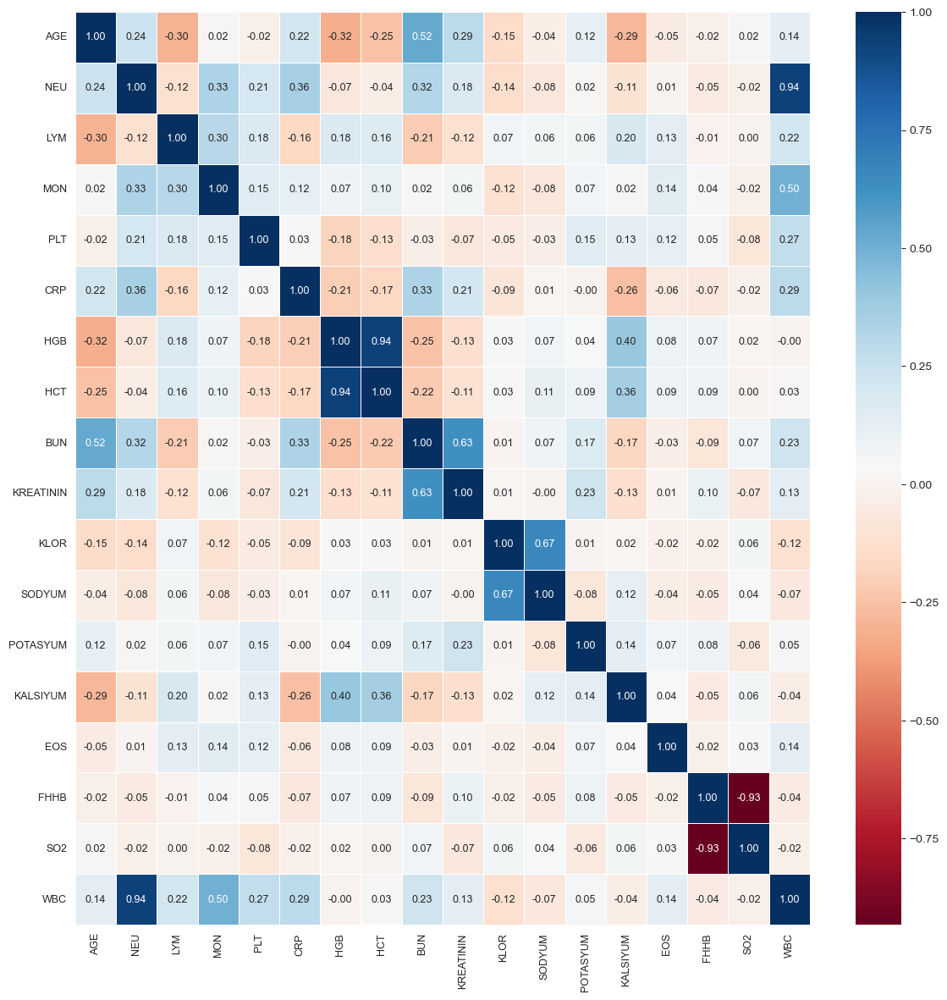

In [39]:
#####################
# Correlation analysis of numerical variables
#####################
high_correlated_cols(df[num_cols])
drop_list = high_correlated_cols(df[num_cols], plot=True) 

In [40]:
drop_list

['HCT', 'SO2', 'WBC']

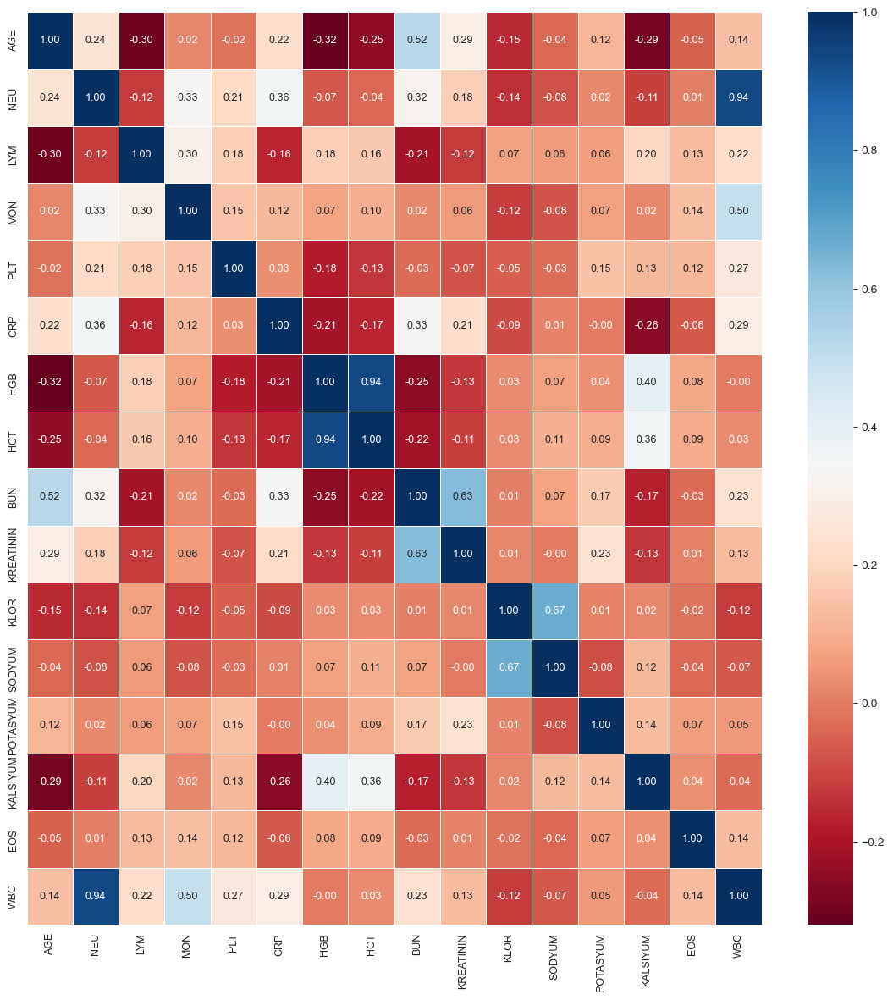

In [41]:
########################
# Deleting Highly Correlated Variables
#######################
# Since there is a correlation of over 80%, we delete the variables ['FHHB', 'SO2']. We will delete the WBC variable later since we will create an inflammation score.
# HTC and HGB are highly correlated. After creating one of these variables, we will delete both of them.
drop_list = ['FHHB', 'SO2']
high_correlated_cols(df[num_cols].drop(drop_list, axis=1), plot=True)
df = df.drop(drop_list, axis=1)

In [42]:
df.shape

(4843, 28)

In [53]:
################################################
# 2. Data Preprocessing & Feature Engineering
################################################

In [43]:
# Separation of variable types
cat_cols, num_cols, cat_but_car = grab_col_names(df, cat_th=5, car_th=20)
cat_cols = [col for col in cat_cols if "PNOMONI" not in col]

In [44]:
# Determine the Outliers thresholds 
for col in num_cols:
    print(col,outlier_thresholds(df, col))

AGE (-51.0, 173.0)
NEU (-15.799000000000005, 33.77700000000001)
LYM (-4.385000000000001, 9.015)
MON (-1.1849999999999998, 2.775)
PLT (-284.5, 863.5)
CRP (-261.70000000000005, 436.70000000000005)
HGB (-0.7499999999999982, 26.049999999999997)
HCT (1.6999999999999993, 75.30000000000001)
BUN (-53.21750000000025, 107.36250000000041)
KREATININ (-1.375, 3.865)
KLOR (70.0, 134.0)
SODYUM (114.0, 162.0)
POTASYUM (0.8000000000000003, 8.0)
KALSIYUM (4.600000000000001, 13.399999999999999)
EOS (-0.745, 1.295)
WBC (-14.568499999999965, 37.98749999999994)


In [45]:
# Outliers check
for col in num_cols:
    print(col, check_outlier(df, col))

AGE False
NEU True
LYM True
MON True
PLT True
CRP False
HGB False
HCT False
BUN True
KREATININ True
KLOR True
SODYUM True
POTASYUM True
KALSIYUM False
EOS True
WBC True


In [53]:
# Solving the Outlier Problem
# Baskılama Yöntemi (re-assignment with thresholds)

for col in num_cols:
    replace_with_thresholds(df, col)

# Outliers check

for col in num_cols:
    print(col, check_outlier(df, col))

YAS False
NEU False
LYM False
MON False
PLT False
CRP False
HGB False
HCT False
BUN False
KREATININ False
KLOR False
SODYUM False
POTASYUM False
KALSIYUM False
EOS False
WBC False


In [46]:
check_df(df)

##################### Shape #####################
(4843, 28)
##################### Types #####################
AGE                  int32
GENDER              object
PNOMONI              int64
NEU                float64
LYM                float64
MON                float64
PLT                float64
CRP                float64
HGB                float64
HCT                float64
BUN                float64
KREATININ          float64
KLOR               float64
SODYUM             float64
POTASYUM           float64
KALSIYUM           float64
EOS                float64
WBC                float64
ASTIM                int64
KOAH                 int64
DM_2                 int64
KANSER               int64
BOBREK_HASTASI       int64
KARACIGER            int64
ALZHEIMER            int64
ISKEMIK_KALP         int64
KALP_YETMEZLIGI      int64
AKUT_BRONSIT         int64
dtype: object
##################### Head #####################
   AGE GENDER  PNOMONI   NEU  LYM  MON    PLT   CRP   HGB   HCT   BUN 

In [47]:
# Examining numeric variables with Target
for col in num_cols:
    target_summary_with_num(df, "PNOMONI", col)

               AGE
PNOMONI           
0        55.172317
1        64.300000


              NEU
PNOMONI          
0        6.333786
1        8.796420


              LYM
PNOMONI          
0        2.224472
1        1.988055


              MON
PNOMONI          
0        0.674478
1        0.793544


                PLT
PNOMONI            
0        268.423655
1        270.580110


               CRP
PNOMONI           
0        27.374078
1        56.704851


               HGB
PNOMONI           
0        12.943768
1        12.649613


               HCT
PNOMONI           
0        39.158297
1        38.487816


               BUN
PNOMONI           
0        17.825175
1        24.717743


         KREATININ
PNOMONI           
0         0.952036
1         1.123483


               KLOR
PNOMONI            
0        103.056229
1        101.896781


             SODYUM
PNOMONI            
0        138.219764
1        137.718480


         POTASYUM
PNOMONI          
0        4.287246
1        4

In [48]:
# Examining categorical variables with Target
for col in cat_cols:
    target_summary_with_cat(df, "PNOMONI", col)

        TARGET_MEAN
GENDER             
ERKEK      0.232462
KADIN      0.147905


       TARGET_MEAN
ASTIM             
0         0.186338
1         0.267281


      TARGET_MEAN
KOAH             
0        0.185063
1        0.263158


      TARGET_MEAN
DM_2             
0        0.189985
1        0.188889


        TARGET_MEAN
KANSER             
0          0.190496
1          0.083333


                TARGET_MEAN
BOBREK_HASTASI             
0                  0.186889
1                  0.578947


           TARGET_MEAN
KARACIGER             
0             0.190201
1             0.000000


           TARGET_MEAN
ALZHEIMER             
0             0.190158
1             0.170213


              TARGET_MEAN
ISKEMIK_KALP             
0                0.191093
1                0.100000


                 TARGET_MEAN
KALP_YETMEZLIGI             
0                   0.190036
1                   0.186047


              TARGET_MEAN
AKUT_BRONSIT             
0                0.189831
1     

In [49]:
#################
# Missing Values
#################

In [54]:
na_cols = missing_values_table(df, True)

           n_miss  ratio
KLOR         1858  38.36
CRP          1532  31.63
KALSIYUM     1431  29.55
POTASYUM      909  18.77
SODYUM        851  17.57
EOS           582  12.02
BUN           423   8.73
KREATININ     379   7.83
MON            25   0.52
NEU            18   0.37
LYM            18   0.37
PLT            15   0.31
HGB            15   0.31
WBC            15   0.31
HCT             9   0.19


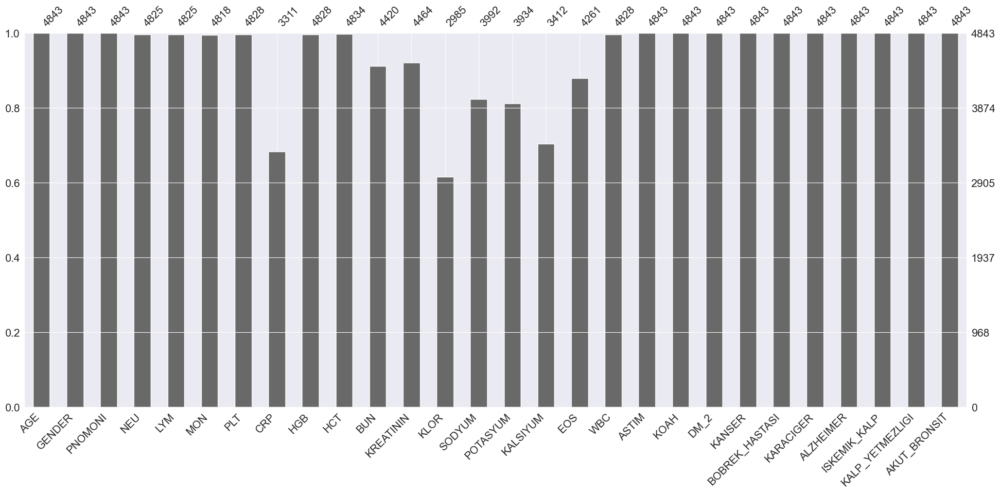

In [50]:
msno.bar(df)
plt.show()

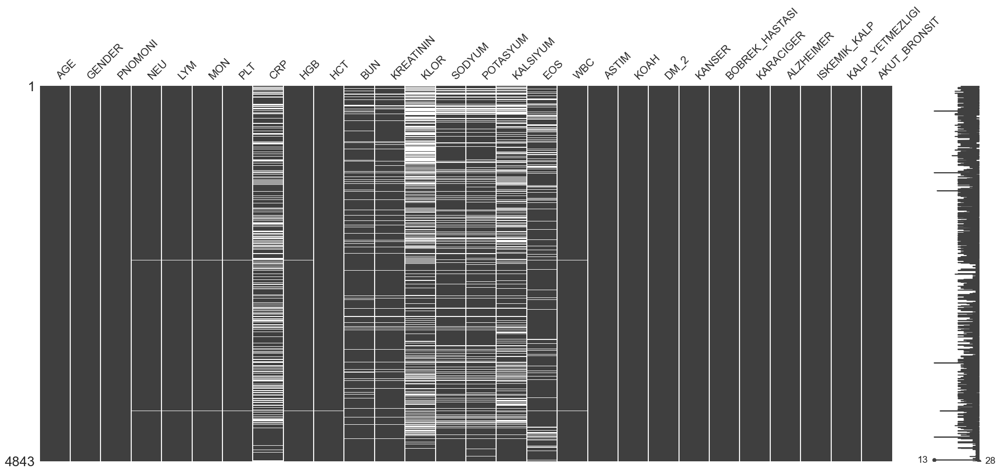

In [51]:
#Examine patterns of missing data
msno.matrix(df)
plt.show()

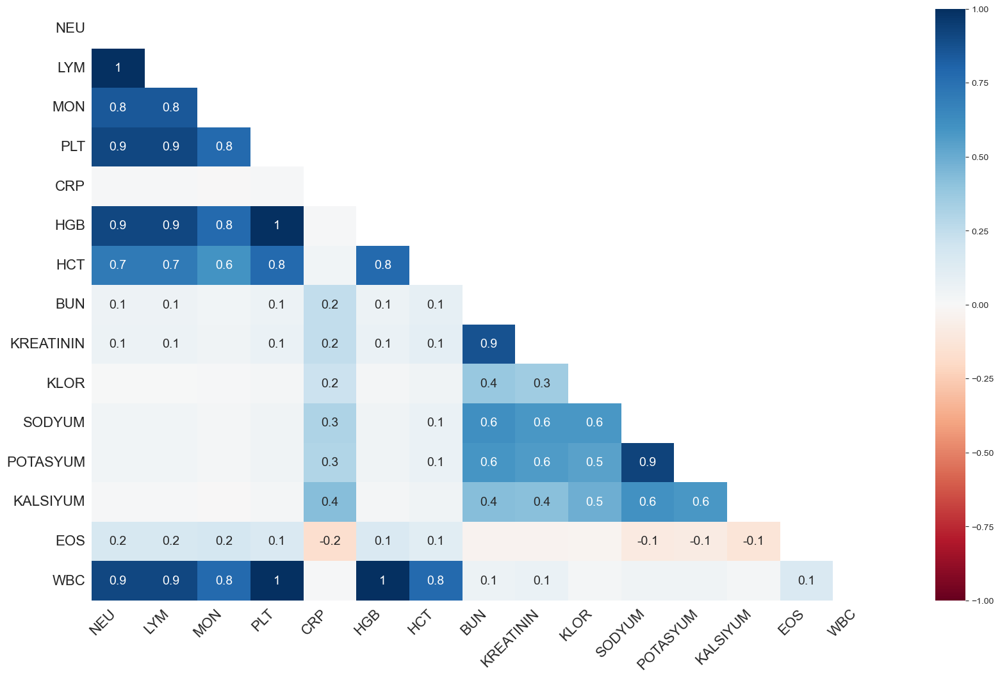

In [52]:
# Missing Data Correlation / Scenario of missing data occurring together / Nullity 75% and above may have occurred together
msno.heatmap(df)
plt.show()

In [55]:
# Examining the Relationship of Missing Values ​​with the Dependent Variable

missing_vs_target(df, "PNOMONI", na_cols)

             TARGET_MEAN  Count
NEU_NA_FLAG                    
0               0.187565   4825
1               0.833333     18


             TARGET_MEAN  Count
LYM_NA_FLAG                    
0               0.187565   4825
1               0.833333     18


             TARGET_MEAN  Count
MON_NA_FLAG                    
0               0.187422   4818
1               0.680000     25


             TARGET_MEAN  Count
PLT_NA_FLAG                    
0               0.187448   4828
1               1.000000     15


             TARGET_MEAN  Count
CRP_NA_FLAG                    
0               0.242827   3311
1               0.075718   1532


             TARGET_MEAN  Count
HGB_NA_FLAG                    
0               0.187448   4828
1               1.000000     15


             TARGET_MEAN  Count
HCT_NA_FLAG                    
0               0.188457   4834
1               1.000000      9


             TARGET_MEAN  Count
BUN_NA_FLAG                    
0               0.200452  

In [56]:
missing_ratio = df.isna().mean() * 100
missing_ratio

AGE                 0.000000
GENDER              0.000000
PNOMONI             0.000000
NEU                 0.371670
LYM                 0.371670
MON                 0.516209
PLT                 0.309725
CRP                31.633285
HGB                 0.309725
HCT                 0.185835
BUN                 8.734256
KREATININ           7.825728
KLOR               38.364650
SODYUM             17.571753
POTASYUM           18.769358
KALSIYUM           29.547801
EOS                12.017345
WBC                 0.309725
ASTIM               0.000000
KOAH                0.000000
DM_2                0.000000
KANSER              0.000000
BOBREK_HASTASI      0.000000
KARACIGER           0.000000
ALZHEIMER           0.000000
ISKEMIK_KALP        0.000000
KALP_YETMEZLIGI     0.000000
AKUT_BRONSIT        0.000000
dtype: float64

In [63]:
#############################################
# Filling in Missing Values ​​with Predictive Assignment
#############################################

In [57]:
# Change data types to reduce modeling times (int64 to int32 - float64 to float32)
df = optimize_dtypes(df)

In [58]:
#Best parameters: {'bootstrap': False, 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
# Convert non-numeric columns to numeric values
label_encoders = {}
for column in df.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column])
    label_encoders[column] = le

# RandomForestRegressor için genişletilmiş parametre grid'i
# En iyi parametrelerle IterativeImputer oluşturma
best_params = {
    'bootstrap': False,
    'max_depth': None,
    'max_features': 'sqrt',
    'min_samples_leaf': 1,
    'min_samples_split': 2,
    'n_estimators': 300,
    'n_jobs': -1 
}

rf_estimator = RandomForestRegressor(**best_params, random_state=0)
imputer = IterativeImputer(estimator=rf_estimator, max_iter=5, random_state=0, n_nearest_features=None, initial_strategy='mean')

df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# GridSearchCV kullanarak en iyi parametreleri bulma (uzun surdugu icin en iyi parametreleri direk kullaniyoruz)
#rf = RandomForestRegressor(random_state=0)
#grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
#grid_search.fit(df.drop(columns=['PNOMONI']), df['PNOMONI'])  # 'PNOMONI' sütununu hedef değişken olarak kullanıyoruz

# En iyi parametrelerle IterativeImputer oluşturma
#best_params = grid_search.best_params_
#imputer = IterativeImputer(estimator=RandomForestRegressor(**best_params, random_state=0), max_iter=10, random_state=0)
#df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Check the min and max values ​​of each column and replace values ​​out of range with the average
for column in df_imputed.columns:
    min_value = df[column].min()
    max_value = df[column].max()
    mean_value = df[column].mean()
    df_imputed[column] = df_imputed[column].apply(lambda x: mean_value if x < min_value or x > max_value else x)

# Get non-numeric columns from original dataframe
for column in df.select_dtypes(include=['object']).columns:
    df_imputed[column] = df[column]

# Reset non-numeric columns to their original values
for column, le in label_encoders.items():
    df_imputed[column] = le.inverse_transform(df_imputed[column].astype(int))

# Merge the dataframe while preserving the column names
df_imputed.columns = df.columns

df_imputed.head()

,AGE,GENDER,PNOMONI,NEU,LYM,MON,PLT,CRP,HGB,HCT,BUN,KREATININ,KLOR,SODYUM,POTASYUM,KALSIYUM,EOS,WBC,ASTIM,KOAH,DM_2,KANSER,BOBREK_HASTASI,KARACIGER,ALZHEIMER,ISKEMIK_KALP,KALP_YETMEZLIGI,AKUT_BRONSIT
0,33.0,KADIN,0.0,5.7,2.2,0.9,353.0,5.563667,13.8,40.299999,10.5757,0.738567,104.0000,136.000000,4.000,9.532700,0.100000,8.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,80.0,ERKEK,0.0,10.9,2.0,1.1,373.0,2.900000,14.3,43.200001,23.0000,1.600000,102.0000,136.000000,4.900,9.300000,0.300000,14.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,78.0,ERKEK,0.0,7.5,1.6,0.5,174.0,13.200000,11.9,36.099998,28.0000,1.090000,102.0000,133.000000,5.000,8.100000,0.230833,9.8,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,52.0,ERKEK,1.0,12.7,1.5,1.1,336.0,13.000000,12.5,38.599998,15.5000,0.980000,101.2502,137.000000,4.000,9.260000,0.200000,15.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,44.0,ERKEK,0.0,5.1,2.2,0.6,212.0,1.798000,15.8,47.700001,12.4000,0.880000,103.9620,139.003667,4.281,9.480567,0.200000,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [59]:
df = df_imputed
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4843 entries, 0 to 4842
Data columns (total 28 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   AGE              4843 non-null   float64
 1   GENDER           4843 non-null   object 
 2   PNOMONI          4843 non-null   float64
 3   NEU              4843 non-null   float64
 4   LYM              4843 non-null   float64
 5   MON              4843 non-null   float64
 6   PLT              4843 non-null   float64
 7   CRP              4843 non-null   float64
 8   HGB              4843 non-null   float64
 9   HCT              4843 non-null   float64
 10  BUN              4843 non-null   float64
 11  KREATININ        4843 non-null   float64
 12  KLOR             4843 non-null   float64
 13  SODYUM           4843 non-null   float64
 14  POTASYUM         4843 non-null   float64
 15  KALSIYUM         4843 non-null   float64
 16  EOS              4843 non-null   float64
 17  WBC           

In [60]:
optimize_dtypes(df)
check_df(df)

##################### Shape #####################
(4843, 28)
##################### Types #####################
AGE                float32
GENDER              object
PNOMONI            float32
NEU                float32
LYM                float32
MON                float32
PLT                float32
CRP                float32
HGB                float32
HCT                float32
BUN                float32
KREATININ          float32
KLOR               float32
SODYUM             float32
POTASYUM           float32
KALSIYUM           float32
EOS                float32
WBC                float32
ASTIM              float32
KOAH               float32
DM_2               float32
KANSER             float32
BOBREK_HASTASI     float32
KARACIGER          float32
ALZHEIMER          float32
ISKEMIK_KALP       float32
KALP_YETMEZLIGI    float32
AKUT_BRONSIT       float32
dtype: object
##################### Head #####################
    AGE GENDER  PNOMONI   NEU  LYM  MON    PLT        CRP   HGB       

In [61]:
#Reduce the dataset to make it balanced

#Set target numbers
target_counts = {0: 1000, 1: 920}

# Balancing the dataset using RandomUnderSampler
undersample = RandomUnderSampler(sampling_strategy=target_counts, random_state=10)
X_under, y_under = undersample.fit_resample(df.drop('PNOMONI', axis=1), df['PNOMONI'])

# Combining reduced and balanced dataset
df_1000_920 = pd.concat([X_under, y_under], axis=1)
#df_1000_920.to_csv('data\df_1000_920.csv', index=False)

################################################################################

In [62]:
df = df_1000_920
# Parsing variable types# Parsing variable types
cat_cols, num_cols, cat_but_car = grab_col_names(df, cat_th=10, car_th=20)
cat_cols = [col for col in cat_cols if "PNOMONI" not in col]

value_counts = df['PNOMONI'].value_counts()
value_ratios = df['PNOMONI'].value_counts(normalize=True) * 100
pd.DataFrame({'Count': value_counts, 'Ratio (%)': value_ratios})

,Count,Ratio (%)
PNOMONI,,
0.0,1000,52.083333
1.0,920,47.916667


In [63]:
#One-Hot Encoding
df = one_hot_encoder(df, cat_cols, drop_first=True)

In [64]:
df.head()

,AGE,NEU,LYM,MON,PLT,CRP,HGB,HCT,BUN,KREATININ,KLOR,SODYUM,POTASYUM,KALSIYUM,EOS,WBC,PNOMONI,GENDER_KADIN,ASTIM_1.0,KOAH_1.0,DM_2_1.0,KANSER_1.0,BOBREK_HASTASI_1.0,KARACIGER_1.0,ALZHEIMER_1.0,ISKEMIK_KALP_1.0,KALP_YETMEZLIGI_1.0,AKUT_BRONSIT_1.0
2308,73.0,8.38,1.54,0.96,148.0,309.000000,9.8,32.200001,26.83,3.57,117.000000,150.000,4.100000,7.500000,0.60,11.58,0.0,1,0,0,0,0,0,0,0,0,0,0
3042,49.0,4.12,3.49,0.73,203.0,2.878667,15.0,41.700001,14.00,0.75,104.000000,140.000,4.400000,9.900000,0.14,8.58,0.0,0,0,0,0,0,0,0,0,0,0,0
3277,43.0,3.94,2.40,0.51,299.0,4.340378,10.5,33.299999,12.67,0.71,106.278336,139.847,4.286667,9.259533,0.27,7.15,0.0,1,0,0,0,0,0,0,0,0,0,0
3400,47.0,4.43,2.54,0.46,268.0,3.841333,11.0,35.099998,12.00,0.69,105.000000,139.000,3.900000,9.300000,0.21,7.67,0.0,1,0,0,0,0,0,0,0,0,0,0
1447,57.0,3.93,2.51,1.00,200.0,5.600000,9.5,31.200001,22.00,0.64,105.000000,141.000,3.800000,9.300000,0.21,7.71,0.0,1,0,0,0,0,0,0,0,0,0,0


In [65]:
df.columns

Index(['AGE', 'NEU', 'LYM', 'MON', 'PLT', 'CRP', 'HGB', 'HCT', 'BUN', 'KREATININ', 'KLOR', 'SODYUM', 'POTASYUM', 'KALSIYUM', 'EOS', 'WBC', 'PNOMONI', 'GENDER_KADIN', 'ASTIM_1.0', 'KOAH_1.0', 'DM_2_1.0', 'KANSER_1.0', 'BOBREK_HASTASI_1.0', 'KARACIGER_1.0', 'ALZHEIMER_1.0', 'ISKEMIK_KALP_1.0', 'KALP_YETMEZLIGI_1.0', 'AKUT_BRONSIT_1.0'], dtype='object')

In [67]:
# Age categories
df.loc[(df['AGE'] < 35), "NEW_AGE_CAT"] = 'CHILD_YOUNG'
df.loc[(df['AGE'] >= 35) & (df['AGE'] <= 55), "NEW_AGE_CAT"] = 'MIDDLEAGE'
df.loc[(df['AGE'] > 55), "NEW_AGE_CAT"] = 'OLD'

# Creating new features
df['CRP_HGB'] = df['CRP'] * df['HGB']
df['BUN_KREATININ'] = df['BUN'] / (df['KREATININ'] + 1e-6)
df['ELEKTROLIT_DIFF'] = df['SODYUM'] - df['KALSIYUM']
df['EOS_NLR_RATIO'] = df['EOS'] / (df['NEU'] + 1e-6)  # NLR yerine NEU kullanıldı
df['POTASYUM_SODYUM_RATIO'] = df['POTASYUM'] / (df['SODYUM'] + 1e-6)
df['LOG_CR'] = np.log(df['CRP'] + 1e-6)
df['SQRT_KREATININ'] = np.sqrt(df['KREATININ'] + 1e-6)
df['STD_HGB_KREATININ'] = df[['HGB', 'KREATININ']].std(axis=1)
df['DISEASES'] = df[
    ['ASTIM_1.0', 'KOAH_1.0', 'DM_2_1.0', 'KANSER_1.0', 'BOBREK_HASTASI_1.0', 'KARACIGER_1.0', 'ALZHEIMER_1.0',
     'ISKEMIK_KALP_1.0', 'KALP_YETMEZLIGI_1.0', 'AKUT_BRONSIT_1.0']].sum(axis=1)
# Ekstra yeni değişkenler
df['WBC_PLT_RATIO'] = df['WBC'] / (df['PLT'] + 1e-6)  # Beyaz kan hücrelerinin trombositlere oranı
df['LYM_NEU_RATIO'] = df['LYM'] / (df['NEU'] + 1e-6)  # Lenfositlerin nötrofillere oranı
df['MON_EOS_RATIO'] = df['MON'] / (df['EOS'] + 1e-6)  # Monositlerin eozinofillere oranı
df['PLT_HGB_PRODUCT'] = df['PLT'] * df['HGB']  # Trombositlerin hemoglobin ile çarpımı
df['SODYUM_KLOR_DIFF'] = df['SODYUM'] - df['KLOR']  # Sodyum ve klor farkı
df['WBC_LOG'] = np.log(df['WBC'] + 1e-6)  # WBC'nin logaritması
df['HCT_HGB'] = (df['HCT'] + df['HGB']) / 2
# Inflmasyon skorlari hesapla
df['NLR'] = df['NEU'] / df['LYM']
df['MLR'] = df['MON'] / df['LYM']
df['PLR'] = df['PLT'] / df['LYM']
df['d_NLR'] = df['NEU'] / (df['WBC'] - df['NEU'])

In [68]:
# HCT can be removed because it creates HGB
df.drop(['HCT', 'HGB'], axis=1, inplace=True)
# Since NLR, MLR, PLR are calculated, NEU, LYM and MON can be removed
df.drop(columns=['NEU', 'LYM', 'MON'], inplace=True)
# Since d_NLR is calculated, WBC can be removed
df.drop(columns=['WBC'], inplace=True)
# Since CRP_HGB is created, CRP and HGB can be removed
df.drop(columns=['CRP'], inplace=True)
# Since BUN_CREATININ is created, BUN and CREATININ can be removed
df.drop(columns=['BUN', 'KREATININ'], inplace=True)
# Since ELECTROLYTE_DIFF and POTASSIUM_SODIUM_RATIO are created, SODIUM and POTASSIUM can be removed
df.drop(columns=['SODYUM', 'POTASYUM'], inplace=True)
# Can be removed to eliminate the need for CALCIUM alone
df.drop(columns=['KALSIYUM'], inplace=True)
# EOS can be removed because EOS_NLR_RATIO is created
df.drop(columns=['EOS'], inplace=True)

df.drop(columns=['ASTIM_1.0', 'KOAH_1.0', 'DM_2_1.0', 'KANSER_1.0',
                 'BOBREK_HASTASI_1.0', 'KARACIGER_1.0', 'ALZHEIMER_1.0',
                 'ISKEMIK_KALP_1.0', 'KALP_YETMEZLIGI_1.0', 'AKUT_BRONSIT_1.0'], inplace=True)

In [69]:
check_df(df)

##################### Shape #####################
(1920, 26)
##################### Types #####################
AGE                      float32
PLT                      float32
KLOR                     float32
PNOMONI                  float32
GENDER_KADIN               int32
NEW_AGE_CAT               object
CRP_HGB                  float32
BUN_KREATININ            float32
ELEKTROLIT_DIFF          float32
EOS_NLR_RATIO            float32
POTASYUM_SODYUM_RATIO    float32
LOG_CR                   float32
SQRT_KREATININ           float32
STD_HGB_KREATININ        float32
DISEASES                   int64
WBC_PLT_RATIO            float32
LYM_NEU_RATIO            float32
MON_EOS_RATIO            float32
PLT_HGB_PRODUCT          float32
SODYUM_KLOR_DIFF         float32
WBC_LOG                  float32
HCT_HGB                  float32
NLR                      float32
MLR                      float32
PLR                      float32
d_NLR                    float32
dtype: object
#################

In [70]:
# Parsing variable types
cat_cols, num_cols, cat_but_car = grab_col_names(df, cat_th=10, car_th=20)
cat_cols = [col for col in cat_cols if "PNOMONI" not in col]

In [71]:
# Outliers check
for col in num_cols:
    print(col, check_outlier(df, col))

AGE False
PLT False
KLOR True
CRP_HGB False
BUN_KREATININ True
ELEKTROLIT_DIFF True
EOS_NLR_RATIO True
POTASYUM_SODYUM_RATIO True
LOG_CR False
SQRT_KREATININ True
STD_HGB_KREATININ False
WBC_PLT_RATIO True
LYM_NEU_RATIO True
MON_EOS_RATIO True
PLT_HGB_PRODUCT False
SODYUM_KLOR_DIFF True
WBC_LOG False
HCT_HGB False
NLR True
MLR True
PLR True
d_NLR True


In [72]:
# Solving the Outlier Problem
# Baskılama Yöntemi (re-assignment with thresholds)
for col in num_cols:
    replace_with_thresholds(df, col)

In [73]:
# Outliers check
for col in num_cols:
    print(col, check_outlier(df, col))

AGE False
PLT False
KLOR False
CRP_HGB False
BUN_KREATININ False
ELEKTROLIT_DIFF False
EOS_NLR_RATIO False
POTASYUM_SODYUM_RATIO False
LOG_CR False
SQRT_KREATININ False
STD_HGB_KREATININ False
WBC_PLT_RATIO False
LYM_NEU_RATIO False
MON_EOS_RATIO False
PLT_HGB_PRODUCT False
SODYUM_KLOR_DIFF False
WBC_LOG False
HCT_HGB False
NLR False
MLR False
PLR False
d_NLR False


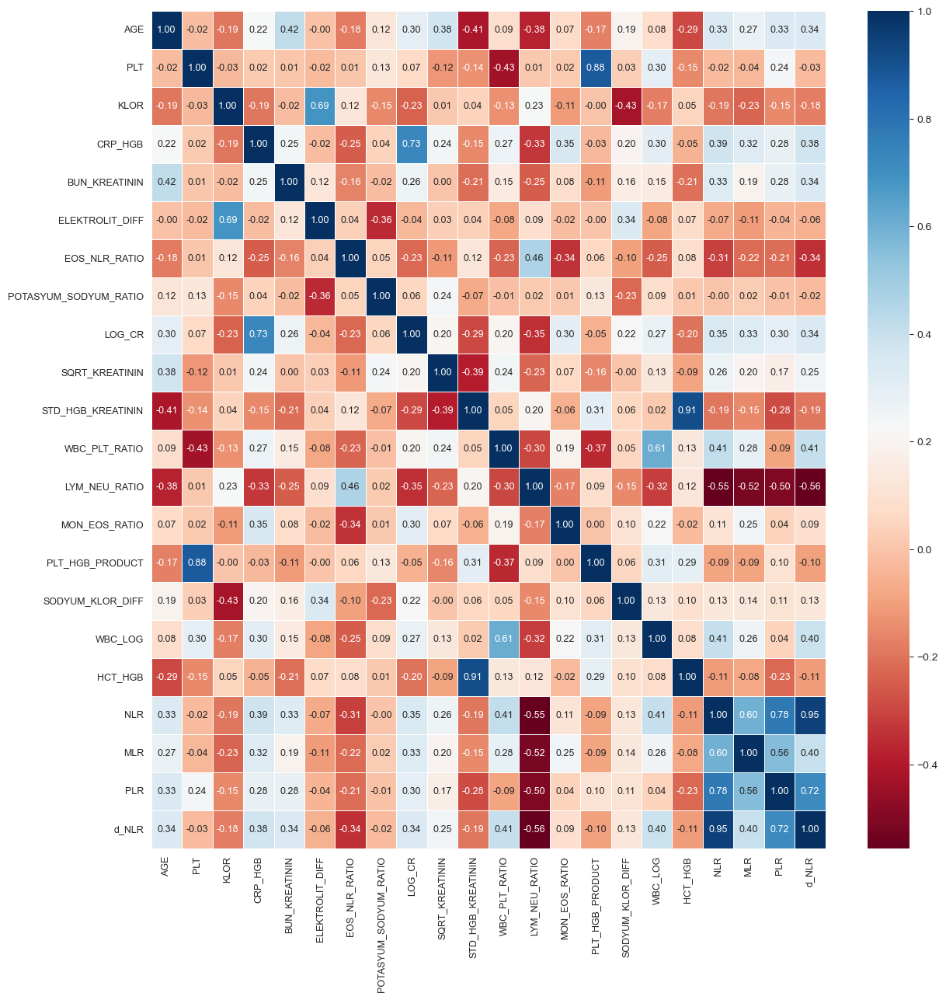

In [74]:
#####################
# Correlation analysis of numerical variables
#####################
high_correlated_cols(df[num_cols], plot=True)
drop_list = high_correlated_cols(df[num_cols]) 

In [75]:
drop_list

['HCT_HGB', 'd_NLR']

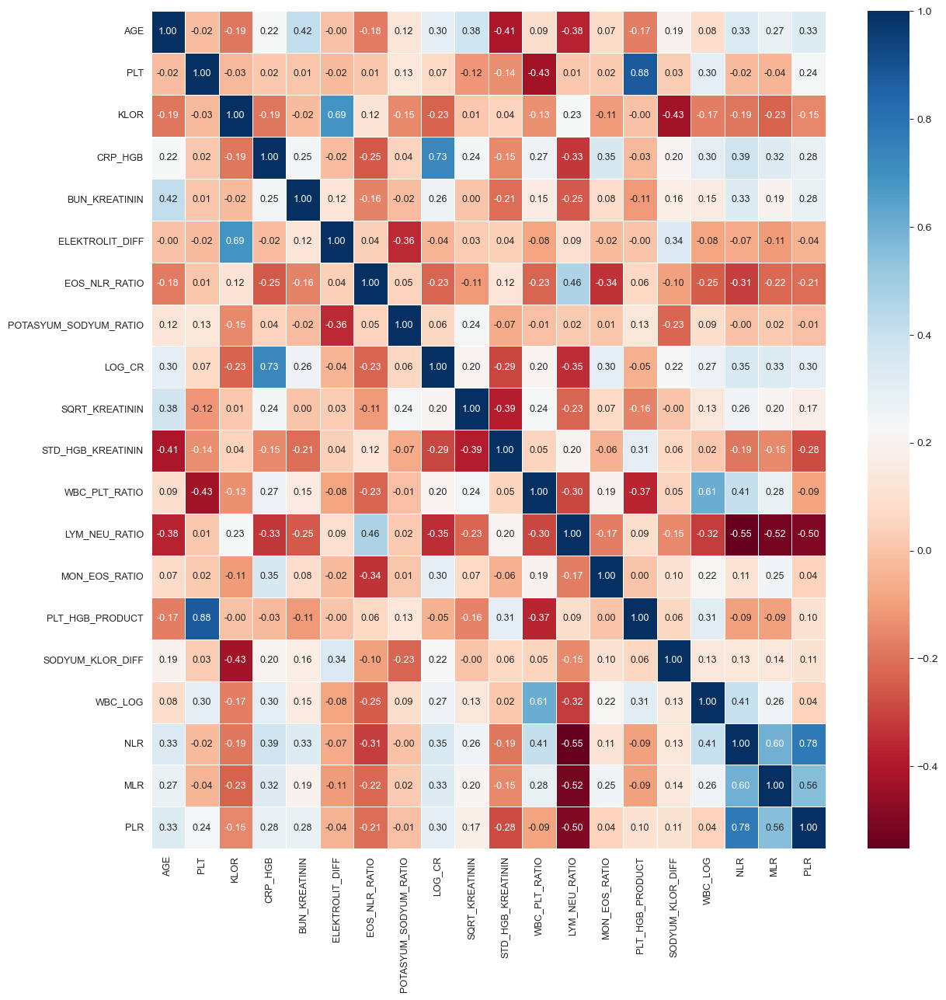

In [76]:
########################
# Deleting Highly Correlated Variables
########################
# We delete variables with correlations over 90%.

high_correlated_cols(df[num_cols].drop(drop_list, axis=1), plot=True)
df = df.drop(drop_list, axis=1)

In [77]:
for col in cat_cols:
    cat_summary(df, col)

             NEW_AGE_CAT      Ratio
NEW_AGE_CAT                        
OLD                  993  51.718750
MIDDLEAGE            779  40.572917
CHILD_YOUNG          148   7.708333
##########################################
              GENDER_KADIN      Ratio
GENDER_KADIN                         
0                     1040  54.166667
1                      880  45.833333
##########################################
          DISEASES      Ratio
DISEASES                     
0             1589  82.760417
1              269  14.010417
2               51   2.656250
3                7   0.364583
6                2   0.104167
4                2   0.104167
##########################################


In [78]:
# Examining categorical variables with Target
for col in cat_cols:
    target_summary_with_cat(df, "PNOMONI", col)

             TARGET_MEAN
NEW_AGE_CAT             
CHILD_YOUNG     0.797297
MIDDLEAGE       0.205392
OLD             0.646526


              TARGET_MEAN
GENDER_KADIN             
0                0.538462
1                0.409091


          TARGET_MEAN
DISEASES             
0            0.473883
1            0.490706
2            0.529412
3            0.571429
4            1.000000
6            1.000000




In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1920 entries, 2308 to 4639
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   AGE                    1920 non-null   float32
 1   PLT                    1920 non-null   float32
 2   KLOR                   1920 non-null   float32
 3   PNOMONI                1920 non-null   float32
 4   GENDER_KADIN           1920 non-null   int32  
 5   NEW_AGE_CAT            1920 non-null   object 
 6   CRP_HGB                1920 non-null   float32
 7   BUN_KREATININ          1920 non-null   float32
 8   ELEKTROLIT_DIFF        1920 non-null   float32
 9   EOS_NLR_RATIO          1920 non-null   float32
 10  POTASYUM_SODYUM_RATIO  1920 non-null   float32
 11  LOG_CR                 1920 non-null   float32
 12  SQRT_KREATININ         1920 non-null   float32
 13  STD_HGB_KREATININ      1920 non-null   float32
 14  DISEASES               1920 non-null   int32  
 15  WBC_PL

In [82]:
optimize_dtypes(df)

,AGE,PLT,KLOR,PNOMONI,GENDER_KADIN,NEW_AGE_CAT,CRP_HGB,BUN_KREATININ,ELEKTROLIT_DIFF,EOS_NLR_RATIO,POTASYUM_SODYUM_RATIO,LOG_CR,SQRT_KREATININ,STD_HGB_KREATININ,DISEASES,WBC_PLT_RATIO,LYM_NEU_RATIO,MON_EOS_RATIO,PLT_HGB_PRODUCT,SODYUM_KLOR_DIFF,WBC_LOG,NLR,MLR,PLR
2308,73.0,148.000000,117.000000,0.0,1,OLD,3028.199951,7.515404,142.500000,0.071599,0.027333,5.733341e+00,1.889445,4.405275,0,0.078243,0.183771,1.599997,1450.400024,33.000000,2.449280,5.441559,0.623377,96.103897
3042,49.0,203.000000,104.000000,0.0,0,MIDDLEAGE,43.180000,18.666641,130.100006,0.033981,0.031429,1.057328e+00,0.866026,10.076272,0,0.042266,0.847087,5.214249,3045.000000,36.000000,2.149434,1.180516,0.209169,58.166187
3277,43.0,299.000000,106.278336,0.0,1,MIDDLEAGE,45.573967,17.845045,130.587463,0.068528,0.030653,1.467962e+00,0.842616,6.922575,0,0.023913,0.609137,1.888882,3139.500000,33.568665,1.967113,1.641667,0.212500,124.583328
3400,47.0,268.000000,105.000000,0.0,1,MIDDLEAGE,42.254669,17.391279,129.699997,0.047404,0.028058,1.345820e+00,0.830663,7.290271,0,0.028619,0.573363,2.190466,2948.000000,34.000000,2.037317,1.744094,0.181102,105.511810
1447,57.0,200.000000,105.000000,0.0,1,OLD,53.200001,34.374947,131.699997,0.053435,0.026950,1.722767e+00,0.800001,6.264966,0,0.038550,0.638677,4.761882,1900.000000,36.000000,2.042518,1.565737,0.398406,79.681274
3492,65.0,347.000000,102.000000,0.0,1,OLD,42.700001,23.188372,130.100006,0.016320,0.030935,1.252763e+00,0.830663,8.138799,0,0.029597,0.375371,7.909019,4233.399902,37.000000,2.329227,2.664032,0.343874,137.154144
1684,90.0,246.000000,104.000000,0.0,0,OLD,26.400002,28.682150,129.600006,0.069124,0.032401,8.754692e-01,1.135782,6.866007,0,0.026870,0.334101,1.499995,2706.000000,34.000000,1.888584,2.993104,0.310345,169.655167
3369,79.0,203.000000,100.000000,0.0,0,OLD,314.649994,10.738248,125.699997,0.036855,0.038519,3.010621e+00,1.220656,9.906567,0,0.055862,0.277641,2.066660,3146.500000,35.000000,2.428336,3.601770,0.274336,89.823006
2450,93.0,144.000000,101.358398,0.0,1,OLD,631.399963,45.634087,127.900002,0.012708,0.029927,4.343805e+00,0.905539,5.218448,0,0.084861,0.102639,5.846109,1180.799927,35.641602,2.503074,9.742857,0.723810,137.142868
2820,80.0,227.000000,96.000000,0.0,0,OLD,2196.870117,15.384608,122.099998,0.012573,0.040458,5.122177e+00,1.486607,7.700393,0,0.068282,0.121542,11.933253,2973.700195,35.000000,2.740840,8.227586,1.234483,156.551712


In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1920 entries, 2308 to 4639
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   AGE                    1920 non-null   float32
 1   PLT                    1920 non-null   float32
 2   KLOR                   1920 non-null   float32
 3   PNOMONI                1920 non-null   float32
 4   GENDER_KADIN           1920 non-null   int32  
 5   NEW_AGE_CAT            1920 non-null   object 
 6   CRP_HGB                1920 non-null   float32
 7   BUN_KREATININ          1920 non-null   float32
 8   ELEKTROLIT_DIFF        1920 non-null   float32
 9   EOS_NLR_RATIO          1920 non-null   float32
 10  POTASYUM_SODYUM_RATIO  1920 non-null   float32
 11  LOG_CR                 1920 non-null   float32
 12  SQRT_KREATININ         1920 non-null   float32
 13  STD_HGB_KREATININ      1920 non-null   float32
 14  DISEASES               1920 non-null   int32  
 15  WBC_PL

In [84]:
#One-Hot Encoding
df = one_hot_encoder(df, cat_cols, drop_first=True)

In [85]:
df.shape

(1920, 29)

In [86]:
df.head()

,AGE,PLT,KLOR,PNOMONI,CRP_HGB,BUN_KREATININ,ELEKTROLIT_DIFF,EOS_NLR_RATIO,POTASYUM_SODYUM_RATIO,LOG_CR,SQRT_KREATININ,STD_HGB_KREATININ,WBC_PLT_RATIO,LYM_NEU_RATIO,MON_EOS_RATIO,PLT_HGB_PRODUCT,SODYUM_KLOR_DIFF,WBC_LOG,NLR,MLR,PLR,NEW_AGE_CAT_MIDDLEAGE,NEW_AGE_CAT_OLD,GENDER_KADIN_1,DISEASES_1,DISEASES_2,DISEASES_3,DISEASES_4,DISEASES_6
2308,73.0,148.0,117.000000,0.0,3028.199951,7.515404,142.500000,0.071599,0.027333,5.733341,1.889445,4.405275,0.078243,0.183771,1.599997,1450.400024,33.000000,2.449280,5.441559,0.623377,96.103897,0,1,1,0,0,0,0,0
3042,49.0,203.0,104.000000,0.0,43.180000,18.666641,130.100006,0.033981,0.031429,1.057328,0.866026,10.076272,0.042266,0.847087,5.214249,3045.000000,36.000000,2.149434,1.180516,0.209169,58.166187,1,0,0,0,0,0,0,0
3277,43.0,299.0,106.278336,0.0,45.573967,17.845045,130.587463,0.068528,0.030653,1.467962,0.842616,6.922575,0.023913,0.609137,1.888882,3139.500000,33.568665,1.967113,1.641667,0.212500,124.583328,1,0,1,0,0,0,0,0
3400,47.0,268.0,105.000000,0.0,42.254669,17.391279,129.699997,0.047404,0.028058,1.345820,0.830663,7.290271,0.028619,0.573363,2.190466,2948.000000,34.000000,2.037317,1.744094,0.181102,105.511810,1,0,1,0,0,0,0,0
1447,57.0,200.0,105.000000,0.0,53.200001,34.374947,131.699997,0.053435,0.026950,1.722767,0.800001,6.264966,0.038550,0.638677,4.761882,1900.000000,36.000000,2.042518,1.565737,0.398406,79.681274,0,1,1,0,0,0,0,0


In [87]:
# Parsing variable types
cat_cols, num_cols, cat_but_car = grab_col_names(df, cat_th=10, car_th=20)
cat_cols = [col for col in cat_cols if "PNOMONI" not in col]

In [88]:
# Scaling Processing
for col in num_cols:
    df[col] = RobustScaler().fit_transform(df[[col]])

In [99]:
#df.to_csv('data\DatasetForModel_1000_920.csv', index=False)

In [89]:
df.columns

Index(['AGE', 'PLT', 'KLOR', 'PNOMONI', 'CRP_HGB', 'BUN_KREATININ', 'ELEKTROLIT_DIFF', 'EOS_NLR_RATIO', 'POTASYUM_SODYUM_RATIO', 'LOG_CR', 'SQRT_KREATININ', 'STD_HGB_KREATININ', 'WBC_PLT_RATIO', 'LYM_NEU_RATIO', 'MON_EOS_RATIO', 'PLT_HGB_PRODUCT', 'SODYUM_KLOR_DIFF', 'WBC_LOG', 'NLR', 'MLR', 'PLR', 'NEW_AGE_CAT_MIDDLEAGE', 'NEW_AGE_CAT_OLD', 'GENDER_KADIN_1', 'DISEASES_1', 'DISEASES_2', 'DISEASES_3', 'DISEASES_4', 'DISEASES_6'], dtype='object')

####################################################################################

In [90]:
# Modelling - We did it!

# Helper Functions

# Confusion Matrix and Classification Report
def plot_confusion_matrix(y, y_pred):
    acc = round(accuracy_score(y, y_pred), 2)
    cm = confusion_matrix(y, y_pred)
    sns.heatmap(cm, annot=True, fmt=".0f")
    plt.xlabel('y_pred')
    plt.ylabel('y')
    plt.title('Accuracy Score: {0}'.format(acc), size=10)
    plt.show()

def base_models(X, y, scoring="roc_auc"):
    print("Base Models....")
    classifiers = [('LR', LogisticRegression()),
                   ('KNN', KNeighborsClassifier()),
                   ("SVC", SVC()),
                   ("CART", DecisionTreeClassifier()),
                   ("RF", RandomForestClassifier()),
                   ('Adaboost', AdaBoostClassifier()),
                   ('GBM', GradientBoostingClassifier()),
                   ('XGBoost', XGBClassifier(eval_metric='logloss')),
                   ('LightGBM', LGBMClassifier(verbose = -1))
                   ]

    for name, classifier in classifiers:
        cv_results = cross_validate(classifier, X, y, cv=5, scoring=scoring)
        print(f"{scoring}: {round(cv_results['test_score'].mean(), 4)} ({name}) ")

# Feature Importance   
def plot_importance(model, features, num=None, save=False):
    if num is None:
        num = len(features.columns)
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[0:num])
    plt.title('Features')
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig('importances.png')

def evaluate_and_plot_models(X, y, scorings=["accuracy", "precision", "recall", "f1", "roc_auc"], num_features=15, save_plots=False):
    print("Evaluating and Plotting Base Models....")
    
    classifiers = [
        ('LR', LogisticRegression()),
        ('KNN', KNeighborsClassifier()),
        ('SVC', SVC(probability=True)),  # SVC with probability=True for cross-validation
        ('CART', DecisionTreeClassifier()),
        ('RF', RandomForestClassifier()),
        ('Adaboost', AdaBoostClassifier()),
        ('GBM', GradientBoostingClassifier()),
        ('XGBoost', XGBClassifier(eval_metric='logloss')),
        ('LightGBM', LGBMClassifier(verbose=-1))
    ]
    
    results = {scoring: {} for scoring in scorings}
    
    for name, classifier in classifiers:
        print(f"\nEvaluating {name}...")
        for scoring in scorings:
            # Evaluate model
            cv_results = cross_validate(classifier, X, y, cv=5, scoring=scoring)
            mean_score = round(cv_results['test_score'].mean(), 4)
            results[scoring][name] = mean_score
            print(f"{scoring}: {mean_score}")
        
        # Fit model to the entire dataset for feature importance plotting
        classifier.fit(X, y)
        
        # Plot feature importance for tree-based models
        if hasattr(classifier, 'feature_importances_'):
            plot_importance(classifier, X, num=num_features, save=save_plots)

    return results

In [91]:
y = df['PNOMONI']
X = df.drop(['PNOMONI'], axis=1)

Evaluating and Plotting Base Models....

Evaluating LR...
accuracy: 0.7214
precision: 0.6996
recall: 0.7326
f1: 0.7154
roc_auc: 0.7999

Evaluating KNN...
accuracy: 0.7182
precision: 0.7027
recall: 0.7141
f1: 0.7083
roc_auc: 0.7778

Evaluating SVC...
accuracy: 0.7333
precision: 0.678
recall: 0.8467
f1: 0.7525
roc_auc: 0.8161

Evaluating CART...
accuracy: 0.8177
precision: 0.7762
recall: 0.8815
f1: 0.8267
roc_auc: 0.8246


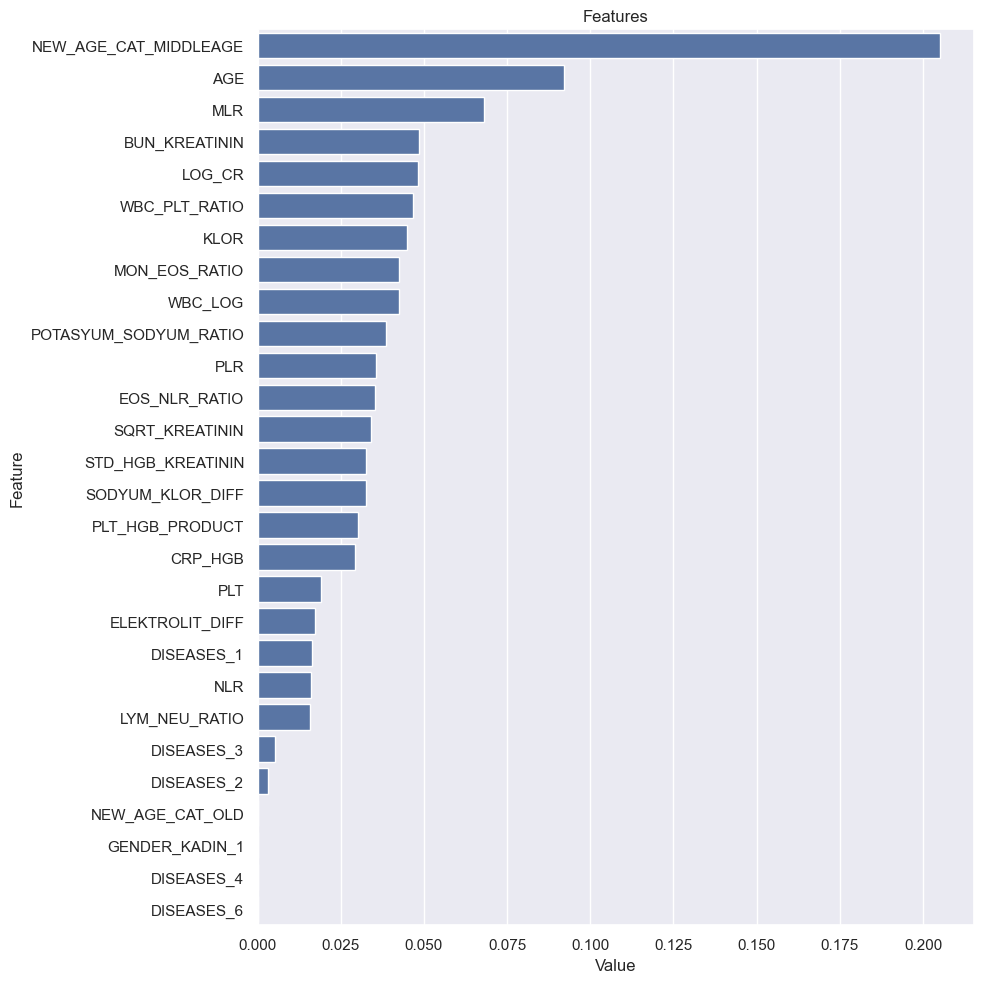


Evaluating RF...
accuracy: 0.8349
precision: 0.7834
recall: 0.9196
f1: 0.8467
roc_auc: 0.939


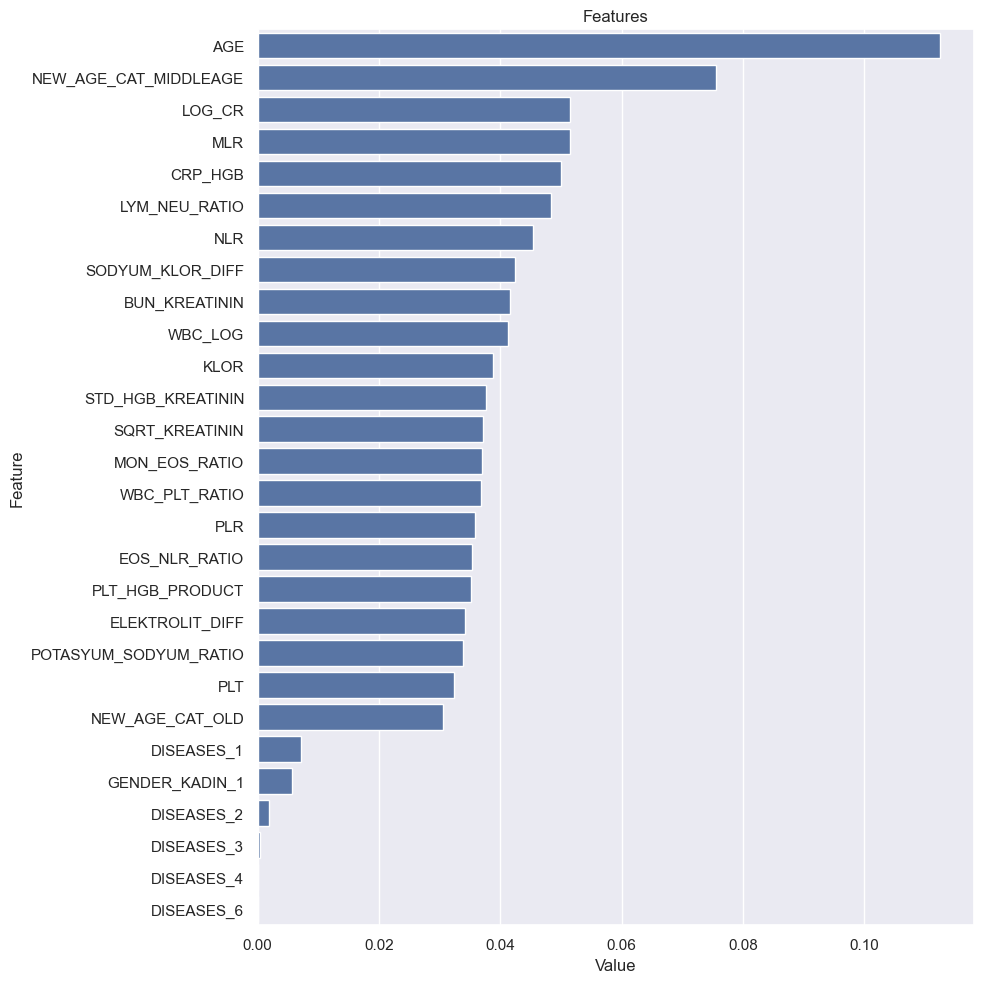


Evaluating Adaboost...
accuracy: 0.7464
precision: 0.7288
recall: 0.7511
f1: 0.7392
roc_auc: 0.8235


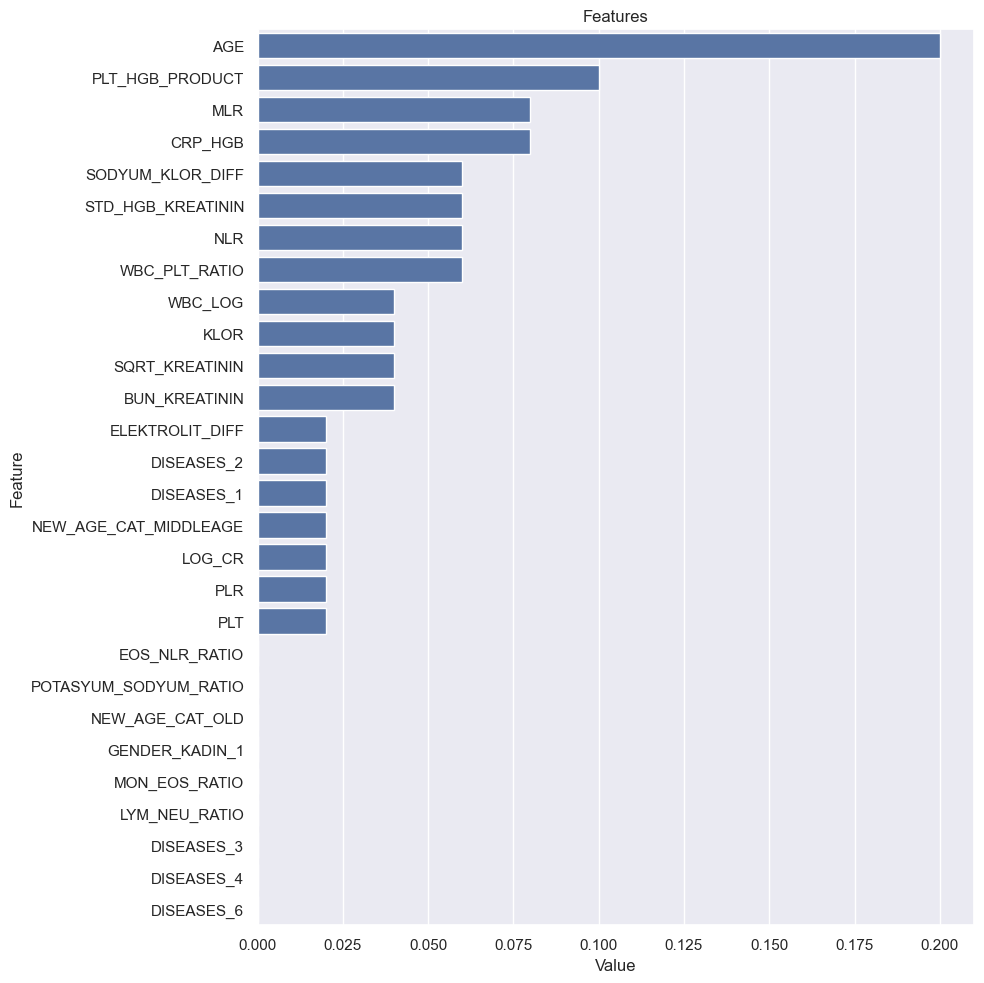


Evaluating GBM...
accuracy: 0.7818
precision: 0.7364
recall: 0.8489
f1: 0.7879
roc_auc: 0.8535


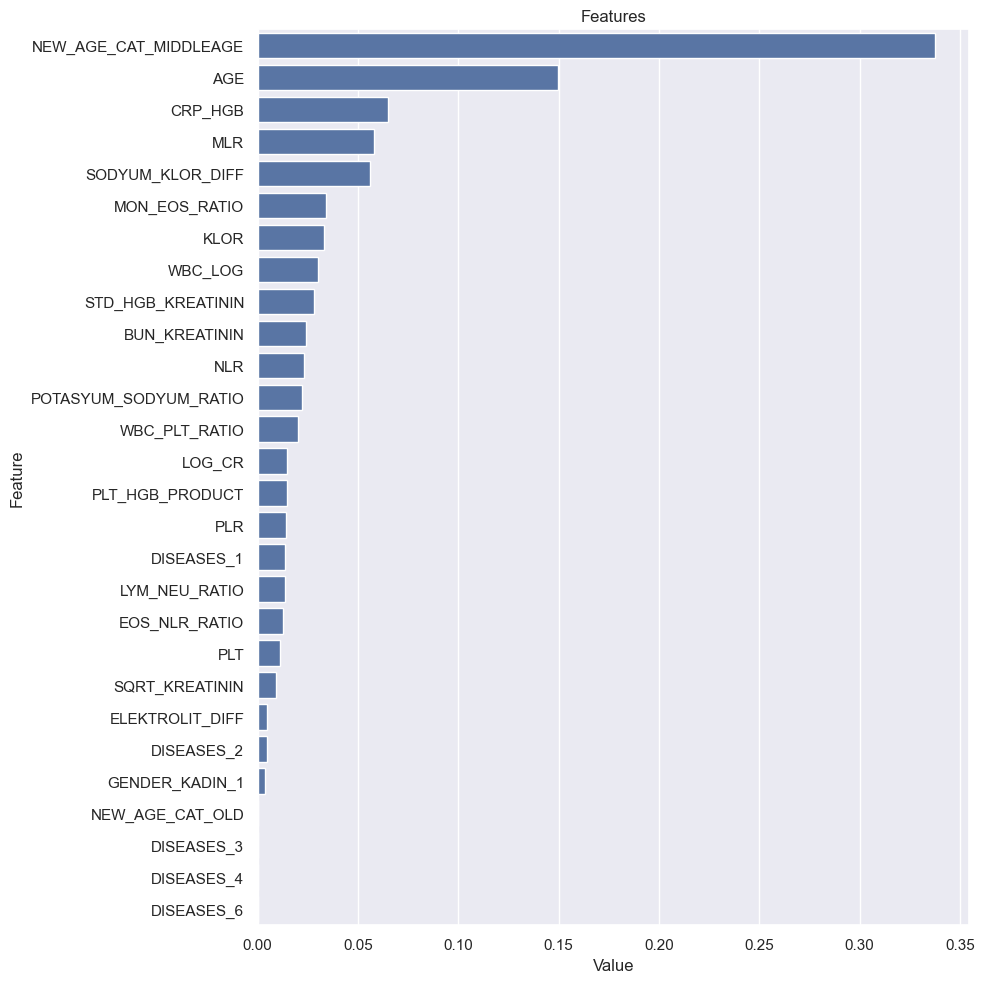


Evaluating XGBoost...
accuracy: 0.8464
precision: 0.7999
recall: 0.9065
f1: 0.8494
roc_auc: 0.9297


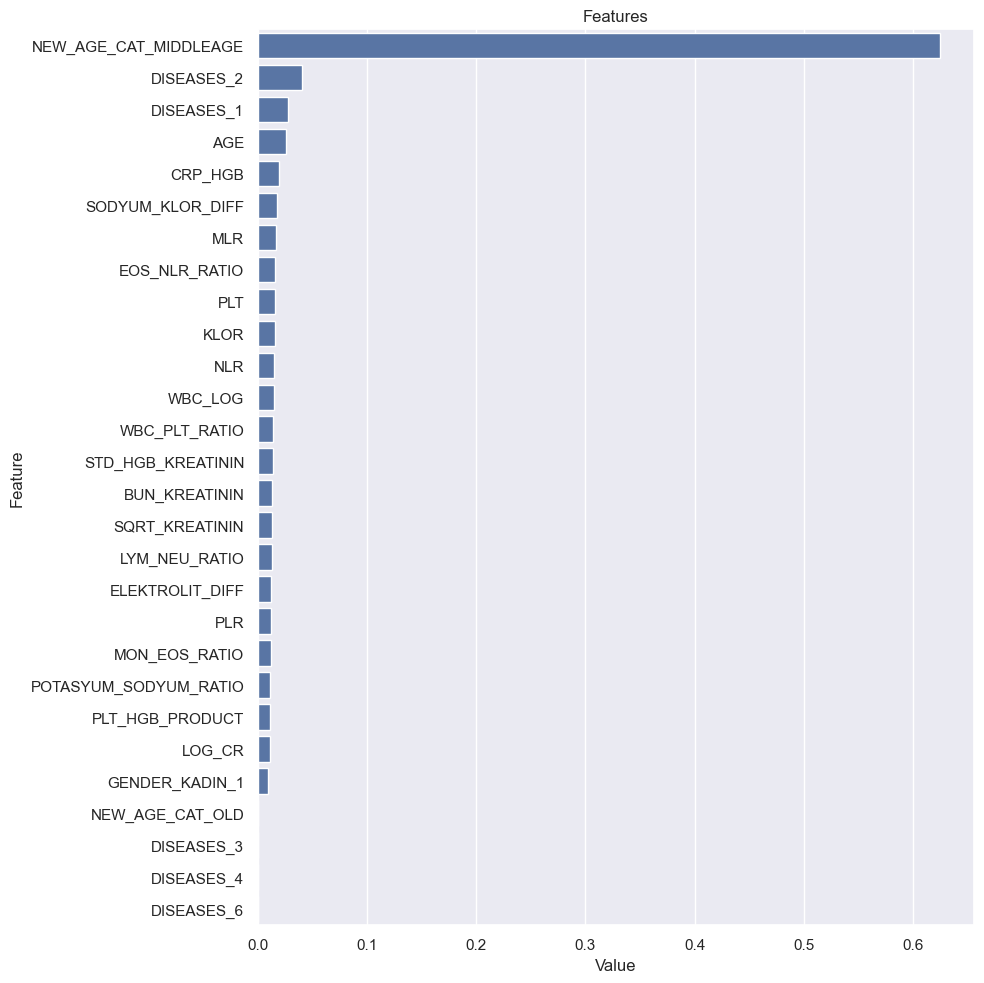


Evaluating LightGBM...
accuracy: 0.8396
precision: 0.7904
recall: 0.9054
f1: 0.844
roc_auc: 0.9299


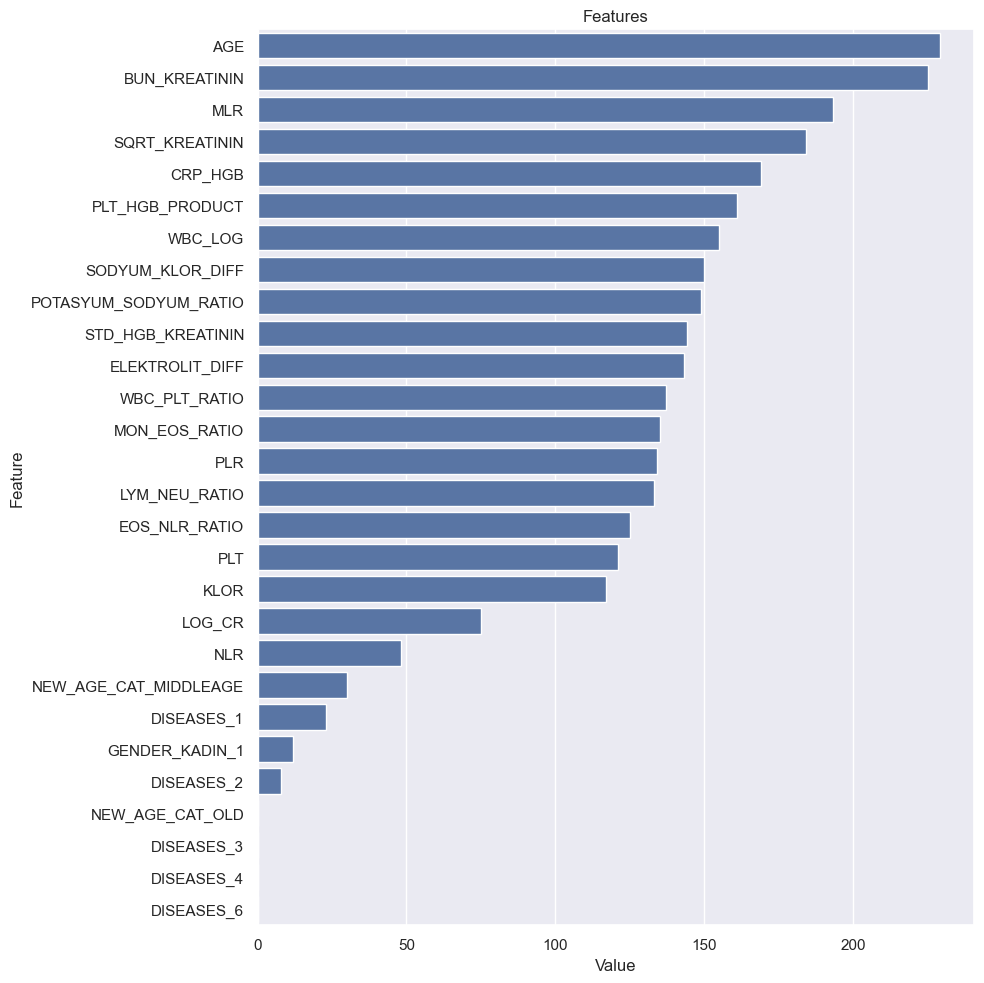

{'accuracy': {'LR': 0.7214,
  'KNN': 0.7182,
  'SVC': 0.7333,
  'CART': 0.8177,
  'RF': 0.8349,
  'Adaboost': 0.7464,
  'GBM': 0.7818,
  'XGBoost': 0.8464,
  'LightGBM': 0.8396},
 'precision': {'LR': 0.6996,
  'KNN': 0.7027,
  'SVC': 0.678,
  'CART': 0.7762,
  'RF': 0.7834,
  'Adaboost': 0.7288,
  'GBM': 0.7364,
  'XGBoost': 0.7999,
  'LightGBM': 0.7904},
 'recall': {'LR': 0.7326,
  'KNN': 0.7141,
  'SVC': 0.8467,
  'CART': 0.8815,
  'RF': 0.9196,
  'Adaboost': 0.7511,
  'GBM': 0.8489,
  'XGBoost': 0.9065,
  'LightGBM': 0.9054},
 'f1': {'LR': 0.7154,
  'KNN': 0.7083,
  'SVC': 0.7525,
  'CART': 0.8267,
  'RF': 0.8467,
  'Adaboost': 0.7392,
  'GBM': 0.7879,
  'XGBoost': 0.8494,
  'LightGBM': 0.844},
 'roc_auc': {'LR': 0.7999,
  'KNN': 0.7778,
  'SVC': 0.8161,
  'CART': 0.8246,
  'RF': 0.939,
  'Adaboost': 0.8235,
  'GBM': 0.8535,
  'XGBoost': 0.9297,
  'LightGBM': 0.9299}}

In [92]:
evaluate_and_plot_models(X, y, num_features=30, save_plots=False)

#########################################################################

In [93]:
##########################################################################################
# Hyperparametre settings
######################################################
from sklearn.model_selection import GridSearchCV, cross_val_predict
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, roc_curve, classification_report
y = df['PNOMONI']
X = df.drop(['PNOMONI'], axis=1)

In [94]:
rf_params = {
    "max_depth": [None],
    "max_features": ['log2'],
    "min_samples_split": [2],
    "n_estimators": [500]
}
xgboost_params = {
    "learning_rate": [0.1],
    "max_depth": [8],
    "n_estimators": [100]
}
lightgbm_params = {
    'learning_rate': [0.3],
    'n_estimators': [100],
    'force_col_wise': [True],
    'num_leaves': [31, 50, 70],
    'min_child_samples': [20, 30, 40],
    'min_child_weight': [0.001, 0.01, 0.1],
    'max_depth': [-1, 8, 10, 20]
}
catboost_params = {
    'iterations': [1000],
    'learning_rate': [0.3],
    'depth': [6],
    'l2_leaf_reg': [3],
    'border_count': [64]
}

In [95]:
classifiers = {
    "Random Forest Classifier": (RandomForestClassifier(random_state=42, n_jobs=-1), rf_params),
    "XGBoost": (XGBClassifier(random_state=42, eval_metric='logloss', n_jobs=-1), xgboost_params),
    "LightGBM Classifier": (LGBMClassifier(random_state=42, n_jobs=-1), lightgbm_params),
    'CatBoost': (CatBoostClassifier(random_state=42, silent=True), catboost_params),
}

Model: Random Forest Classifier


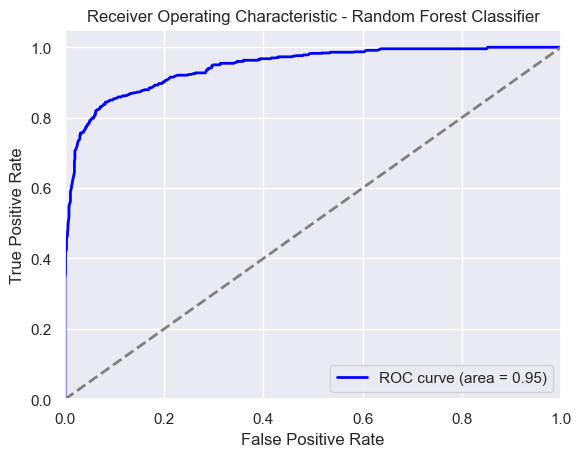

ROC AUC:  0.9453592391304348

Classification Report:
               precision    recall  f1-score   support

         0.0       0.91      0.76      0.83      1000
         1.0       0.78      0.92      0.84       920

    accuracy                           0.84      1920
   macro avg       0.85      0.84      0.84      1920
weighted avg       0.85      0.84      0.84      1920


Precision for class 0.0: 0.9122596153846154
Precision for class 1.0: 0.7784926470588235

Recall for class 0.0: 0.759
Recall for class 1.0: 0.9206521739130434

F1-score for class 0.0: 0.8286026200873362
F1-score for class 1.0: 0.8436254980079682

------------------------------------------------------------

Model: XGBoost


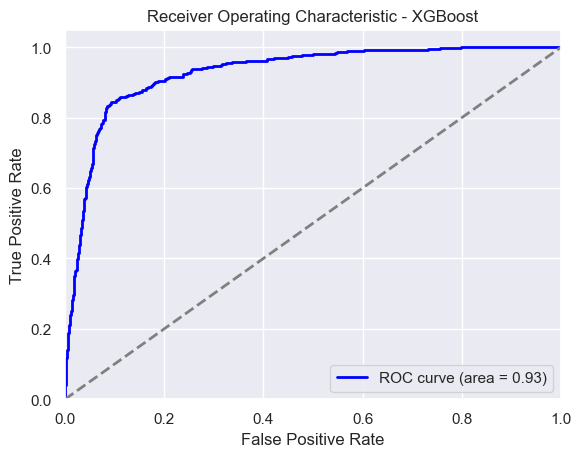

ROC AUC:  0.928238043478261

Classification Report:
               precision    recall  f1-score   support

         0.0       0.91      0.78      0.84      1000
         1.0       0.80      0.91      0.85       920

    accuracy                           0.85      1920
   macro avg       0.85      0.85      0.85      1920
weighted avg       0.85      0.85      0.85      1920


Precision for class 0.0: 0.9084588644264194
Precision for class 1.0: 0.7956480605487228

Recall for class 0.0: 0.784
Recall for class 1.0: 0.9141304347826087

F1-score for class 0.0: 0.8416532474503489
F1-score for class 1.0: 0.8507840161861406

------------------------------------------------------------

Model: LightGBM Classifier


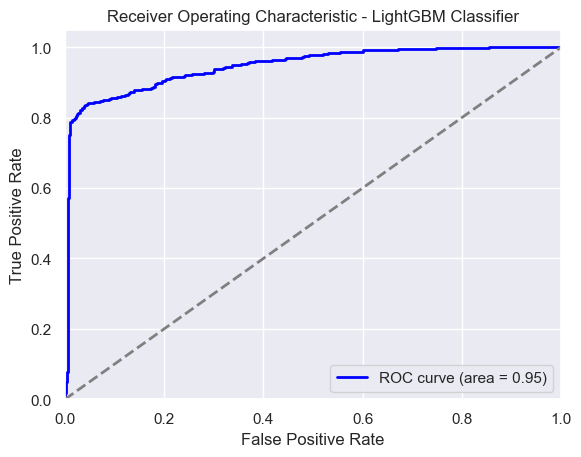

ROC AUC:  0.9463380434782608

Classification Report:
               precision    recall  f1-score   support

         0.0       0.90      0.80      0.85      1000
         1.0       0.81      0.91      0.85       920

    accuracy                           0.85      1920
   macro avg       0.85      0.85      0.85      1920
weighted avg       0.86      0.85      0.85      1920


Precision for class 0.0: 0.9027149321266968
Precision for class 1.0: 0.805019305019305

Recall for class 0.0: 0.798
Recall for class 1.0: 0.9065217391304348

F1-score for class 0.0: 0.8471337579617835
F1-score for class 1.0: 0.852760736196319

------------------------------------------------------------

Model: CatBoost


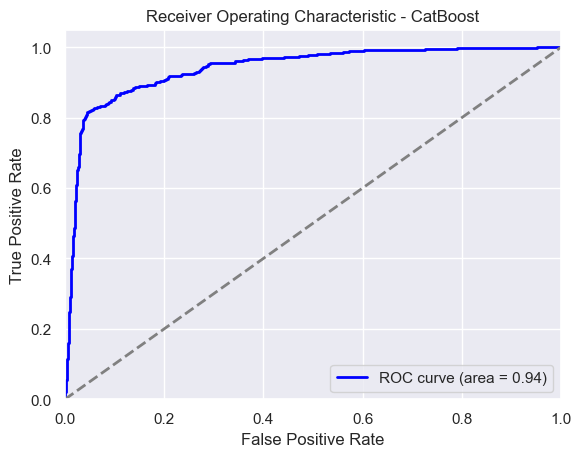

ROC AUC:  0.9402934782608695

Classification Report:
               precision    recall  f1-score   support

         0.0       0.91      0.79      0.85      1000
         1.0       0.80      0.91      0.85       920

    accuracy                           0.85      1920
   macro avg       0.85      0.85      0.85      1920
weighted avg       0.86      0.85      0.85      1920


Precision for class 0.0: 0.908256880733945
Precision for class 1.0: 0.8015267175572519

Recall for class 0.0: 0.792
Recall for class 1.0: 0.9130434782608695

F1-score for class 0.0: 0.8461538461538461
F1-score for class 1.0: 0.8536585365853658

------------------------------------------------------------



In [97]:
for name, (model, params) in classifiers.items():
    print(f"Model: {name}")
    
    # GridSearchCV ile hiperparametre optimizasyonu
    grid_search = GridSearchCV(model, params, cv=5, scoring='roc_auc', n_jobs=-1)
    grid_search.fit(X, y)
    
    # En iyi modeli kullanarak çapraz doğrulama tahminleri yapma
    best_model = grid_search.best_estimator_
    y_pred = cross_val_predict(best_model, X, y, cv=5, method='predict')
    y_pred_proba = cross_val_predict(best_model, X, y, cv=5, method='predict_proba')
    
    # ROC AUC değeri ve grafiği
    roc_auc = roc_auc_score(y, y_pred_proba[:, 1])
    fpr, tpr, thresholds = roc_curve(y, y_pred_proba[:, 1])
    
    plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic - {name}')
    plt.legend(loc="lower right")
    plt.show()
    
    # Precision, recall, f1-score hesaplama
    precision_0 = precision_score(y, y_pred, pos_label=0)
    precision_1 = precision_score(y, y_pred, pos_label=1)
    
    recall_0 = recall_score(y, y_pred, pos_label=0)
    recall_1 = recall_score(y, y_pred, pos_label=1)
    
    f1_0 = f1_score(y, y_pred, pos_label=0)
    f1_1 = f1_score(y, y_pred, pos_label=1)
    
    # Sonuçları yazdırma
    print("ROC AUC: ", roc_auc)
    print("\nClassification Report:\n", classification_report(y, y_pred))
    print("\nPrecision for class 0.0:", precision_0)
    print("Precision for class 1.0:", precision_1)
    print("\nRecall for class 0.0:", recall_0)
    print("Recall for class 1.0:", recall_1)
    print("\nF1-score for class 0.0:", f1_0)
    print("F1-score for class 1.0:", f1_1)
    print("\n" + "-" * 60 + "\n")

In [98]:
##########################################################################################
# Hyperparametre settings with FUNCTIONAL
######################################################
y = df['PNOMONI']
X = df.drop(['PNOMONI'], axis=1)
#knn_params = {"n_neighbors": range(2, 50)}

In [99]:
# Hyperparameter Optimization
def hyperparameter_optimization(X, y):
    print("Hyperparameter Optimization....")
    classifiers = [
        ('RF', RandomForestClassifier(random_state=42, n_jobs=-1),
         {
             "max_depth": [None],
             "max_features": ['log2'],
             "min_samples_split": [2],
             "n_estimators": [500]
         }
         ),
        ('XGBoost', XGBClassifier(random_state=42, n_jobs=-1),
         {
             "learning_rate": [0.1],
             "max_depth": [8],
             "n_estimators": [100]
         }
         ),
        ('LightGBM', LGBMClassifier(random_state=42, n_jobs=-1, verbose =-1),
         {
             'learning_rate': [0.3],
             'n_estimators': [100],
             'force_col_wise': [True],
             'num_leaves': [31, 50, 70],
             'min_child_samples': [20, 30, 40],
             'min_child_weight': [0.001, 0.01, 0.1],
             'max_depth': [-1, 8, 10, 20]
         }
         ),
        ('CatBoost', CatBoostClassifier(random_state=42, silent=True),
         {
             'iterations': [1000],
             'learning_rate': [0.3],
             'depth': [6],
             'l2_leaf_reg': [3],
             'border_count': [64]
         }
         )
    ]

    cv = 5
    scoring = "roc_auc"
    best_models = {}
    for name, classifier, params in classifiers:
        print(f"########## {name} ##########")
        cv_results = cross_validate(classifier, X, y, cv=cv, scoring=scoring, n_jobs=-1)
        print(f"{scoring} (Before): {round(cv_results['test_score'].mean(), 4)}")

        gs_best = GridSearchCV(classifier, params, cv=cv, n_jobs=-1).fit(X, y)

        if hasattr(gs_best, 'best_params_'):
            final_model = classifier.set_params(**gs_best.best_params_)
            cv_results = cross_validate(final_model, X, y, cv=cv, scoring=scoring, n_jobs=-1)
            print(f"{scoring} (After): {round(cv_results['test_score'].mean(), 4)}")
            print(f"{name} best params: {gs_best.best_params_}", end="\n\n")
            best_models[name] = final_model
        else:
            print(f"GridSearchCV did not find best parameters for {name}.")

    return best_models

In [100]:
best_models = hyperparameter_optimization(X, y)

Hyperparameter Optimization....
########## RF ##########
roc_auc (Before): 0.9403
roc_auc (After): 0.9449
RF best params: {'max_depth': None, 'max_features': 'log2', 'min_samples_split': 2, 'n_estimators': 500}

########## XGBoost ##########
roc_auc (Before): 0.9297
roc_auc (After): 0.928
XGBoost best params: {'learning_rate': 0.1, 'max_depth': 8, 'n_estimators': 100}

########## LightGBM ##########
roc_auc (Before): 0.9299
roc_auc (After): 0.9384
LightGBM best params: {'force_col_wise': True, 'learning_rate': 0.3, 'max_depth': 20, 'min_child_samples': 40, 'min_child_weight': 0.001, 'n_estimators': 100, 'num_leaves': 50}

########## CatBoost ##########
roc_auc (Before): 0.9079
roc_auc (After): 0.9405
CatBoost best params: {'border_count': 64, 'depth': 6, 'iterations': 1000, 'l2_leaf_reg': 3, 'learning_rate': 0.3}



In [101]:
##########################################################################################
# ÇOKLU MODEL KURULUMU
######################################################
# Stacking & Ensemble Learning
def voting_classifier(best_models, X, y):
    print("Voting Classifier...")
    voting_clf = VotingClassifier(estimators=[
        ('CatBoost', best_models["CatBoost"]),
        ('RF', best_models["RF"]),
        ('XGBoost', best_models["XGBoost"]),
        ('LightGBM', best_models["LightGBM"])],
        voting='soft', n_jobs=-1).fit(X, y)

    cv_results = cross_validate(voting_clf, X, y, cv=5, scoring=["accuracy", "f1", "roc_auc"], n_jobs=-1)
    print(f"Accuracy: {cv_results['test_accuracy'].mean()}")
    print(f"F1Score: {cv_results['test_f1'].mean()}")
    print(f"ROC_AUC: {cv_results['test_roc_auc'].mean()}")
    return voting_clf

In [102]:
voting_clf = voting_classifier(best_models, X, y)

Voting Classifier...
Accuracy: 0.8526041666666666
F1Score: 0.8568264446705207
ROC_AUC: 0.9486467391304346


Plotting SHAP summary for CatBoost


 98%|===================| 1887/1920 [00:46<00:00]        

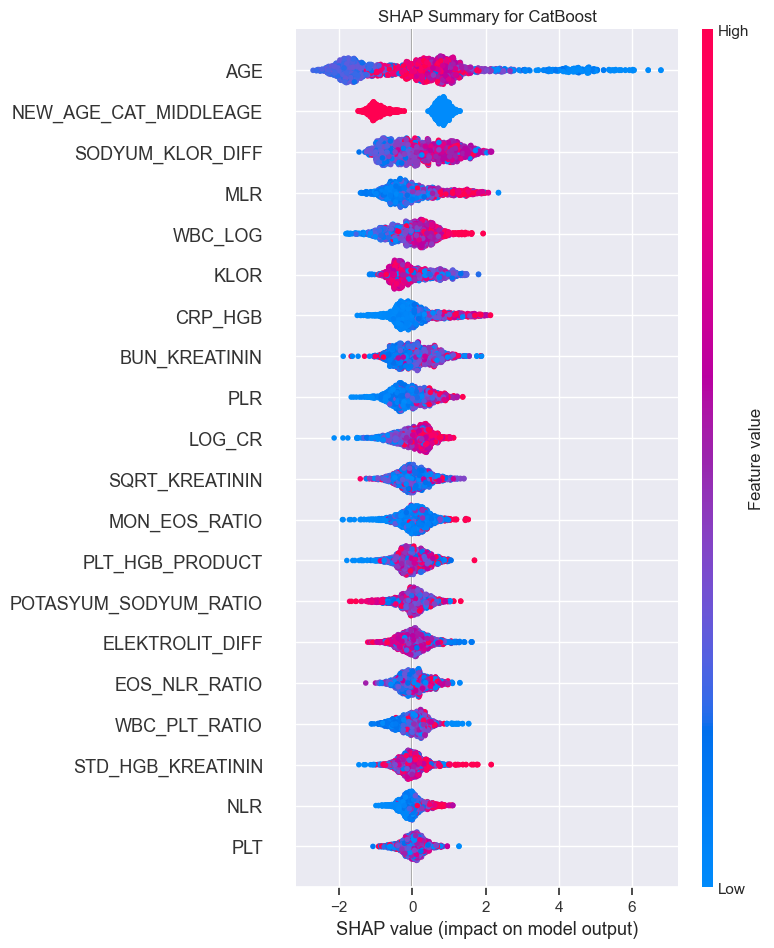

Plotting SHAP summary for RF


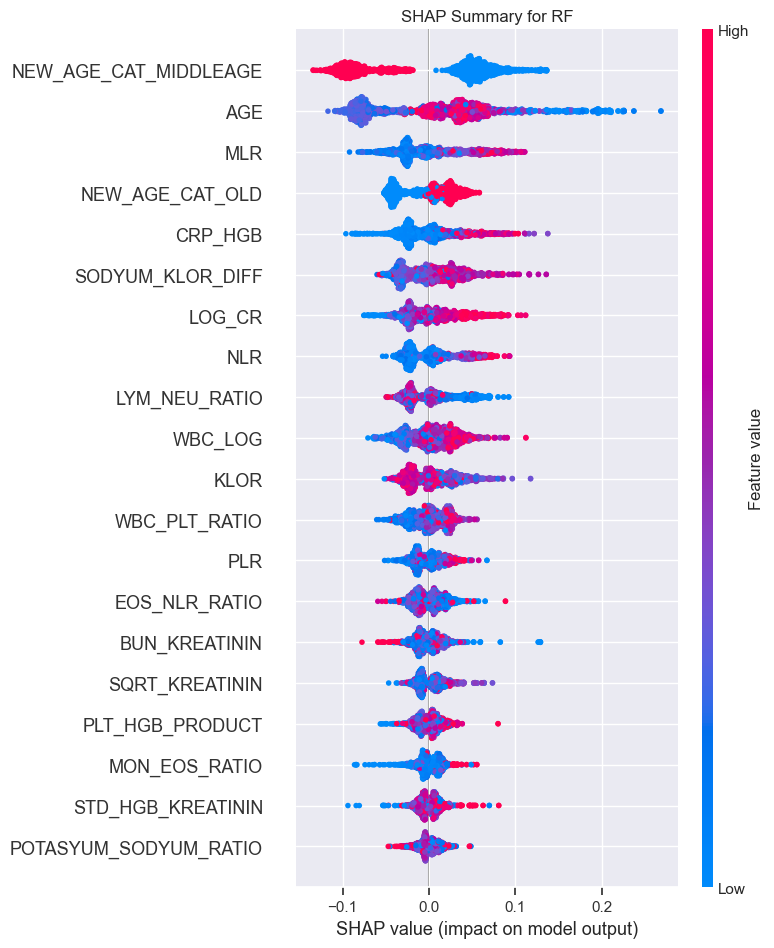

Plotting SHAP summary for XGBoost


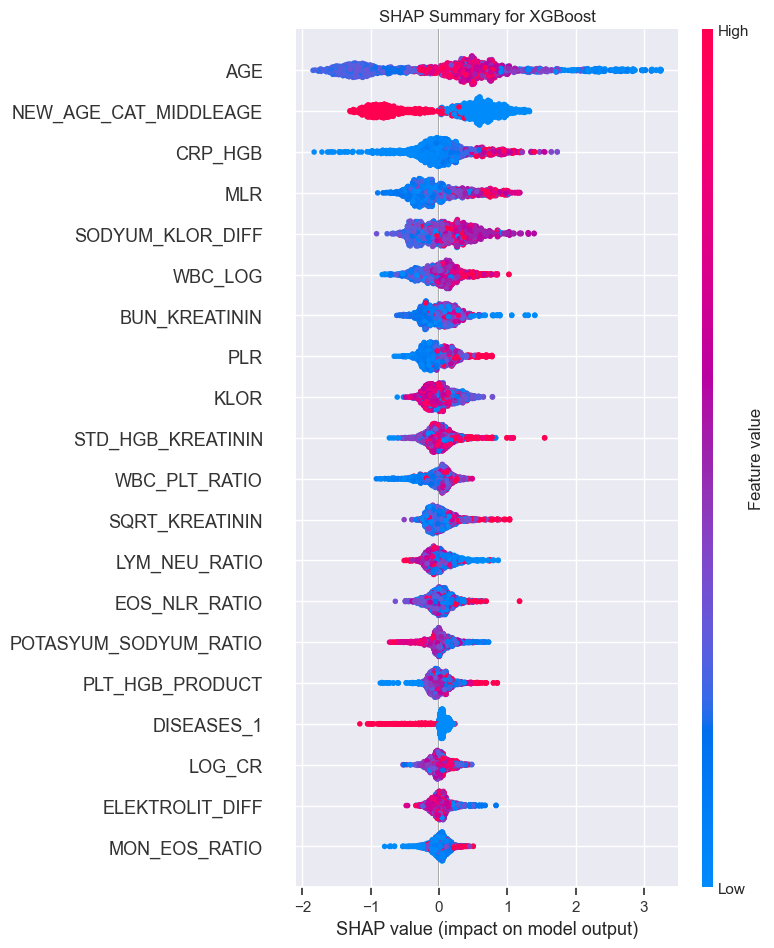

Plotting SHAP summary for LightGBM


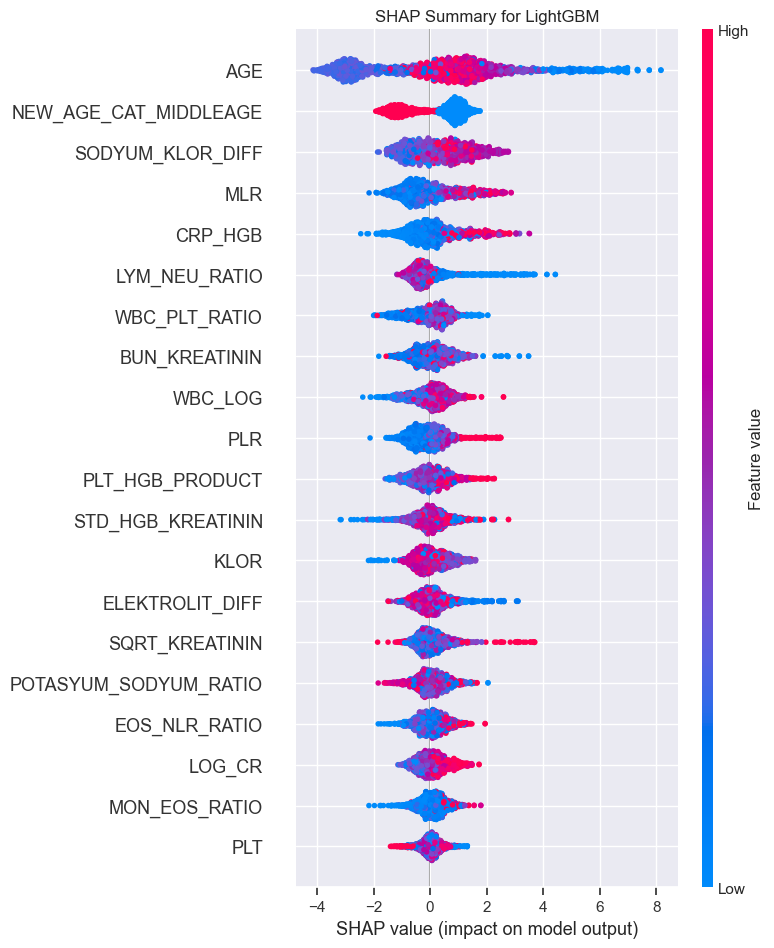

In [103]:
def plot_shap_summary_voting_classifier(voting_clf, X):
    for name, model in voting_clf.named_estimators_.items():
        print(f"Plotting SHAP summary for {name}")
        try:
            if isinstance(model, RandomForestClassifier):
                explainer = shap.TreeExplainer(model)
                shap_values = explainer.shap_values(X)
  
                shap.summary_plot(shap_values[:,:,1], X, show=False, max_display=20)
                   
                plt.title(f"SHAP Summary for {name}")
                plt.savefig(f"shap_summary_{name}.jpeg", format='jpeg')
                plt.show()
            else:
                explainer = shap.TreeExplainer(model, X)
                shap_values = explainer(X, check_additivity=False)
                
                # SHAP özet grafiğini göster
                shap.summary_plot(shap_values, X, show=False, max_display=20)
                plt.title(f"SHAP Summary for {name}")
                plt.savefig(f"shap_summary_{name}.jpeg", format='jpeg')
                plt.show()
        except Exception as e:
            print(f"Could not generate SHAP plot for {name}: {e}")

# Example usage
plot_shap_summary_voting_classifier(voting_clf, X)

Hyperparameter Optimization....
########## RF ##########
roc_auc (Before): 0.9403
roc_auc (After): 0.9449
RF best params: {'max_depth': None, 'max_features': 'log2', 'min_samples_split': 2, 'n_estimators': 500}

ROC AUC (Before): 0.9406
ROC AUC (After): 0.9454
Precision for class 0.0 (Before): 0.9089
Precision for class 1.0 (Before): 0.7703
Recall for class 0.0 (Before): 0.7480
Recall for class 1.0 (Before): 0.9185
F1-score for class 0.0 (Before): 0.8206
F1-score for class 1.0 (Before): 0.8379
Precision for class 0.0 (After): 0.9123
Precision for class 1.0 (After): 0.7785
Recall for class 0.0 (After): 0.7590
Recall for class 1.0 (After): 0.9207
F1-score for class 0.0 (After): 0.8286
F1-score for class 1.0 (After): 0.8436


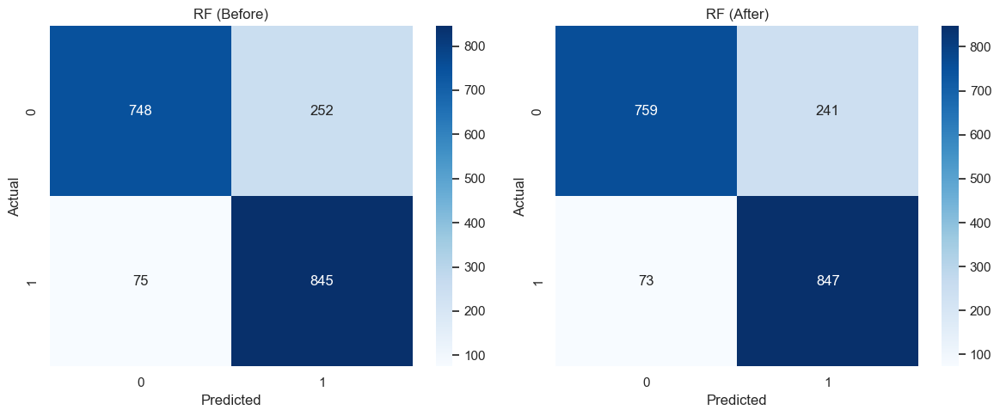


------------------------------------------------------------

########## XGBoost ##########
roc_auc (Before): 0.9297
roc_auc (After): 0.928
XGBoost best params: {'learning_rate': 0.1, 'max_depth': 8, 'n_estimators': 100}

ROC AUC (Before): 0.9296
ROC AUC (After): 0.9282
Precision for class 0.0 (Before): 0.9019
Precision for class 1.0 (Before): 0.7996
Recall for class 0.0 (Before): 0.7910
Recall for class 1.0 (Before): 0.9065
F1-score for class 0.0 (Before): 0.8428
F1-score for class 1.0 (Before): 0.8497
Precision for class 0.0 (After): 0.9085
Precision for class 1.0 (After): 0.7956
Recall for class 0.0 (After): 0.7840
Recall for class 1.0 (After): 0.9141
F1-score for class 0.0 (After): 0.8417
F1-score for class 1.0 (After): 0.8508


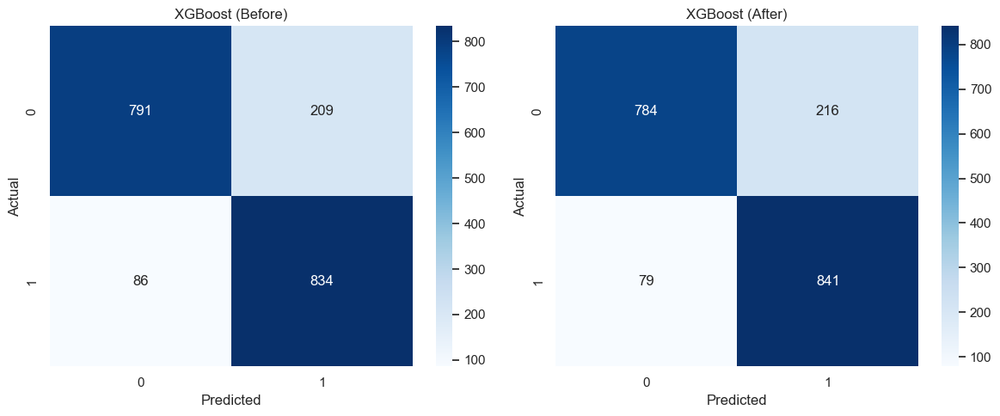


------------------------------------------------------------

########## LightGBM ##########
roc_auc (Before): 0.9299
roc_auc (After): 0.9384
LightGBM best params: {'force_col_wise': True, 'learning_rate': 0.3, 'max_depth': 20, 'min_child_samples': 40, 'min_child_weight': 0.001, 'n_estimators': 100, 'num_leaves': 50}

ROC AUC (Before): 0.9302
ROC AUC (After): 0.9388
Precision for class 0.0 (Before): 0.8995
Precision for class 1.0 (Before): 0.7903
Recall for class 0.0 (Before): 0.7790
Recall for class 1.0 (Before): 0.9054
F1-score for class 0.0 (Before): 0.8349
F1-score for class 1.0 (Before): 0.8440
Precision for class 0.0 (After): 0.9170
Precision for class 1.0 (After): 0.8053
Recall for class 0.0 (After): 0.7950
Recall for class 1.0 (After): 0.9217
F1-score for class 0.0 (After): 0.8516
F1-score for class 1.0 (After): 0.8596


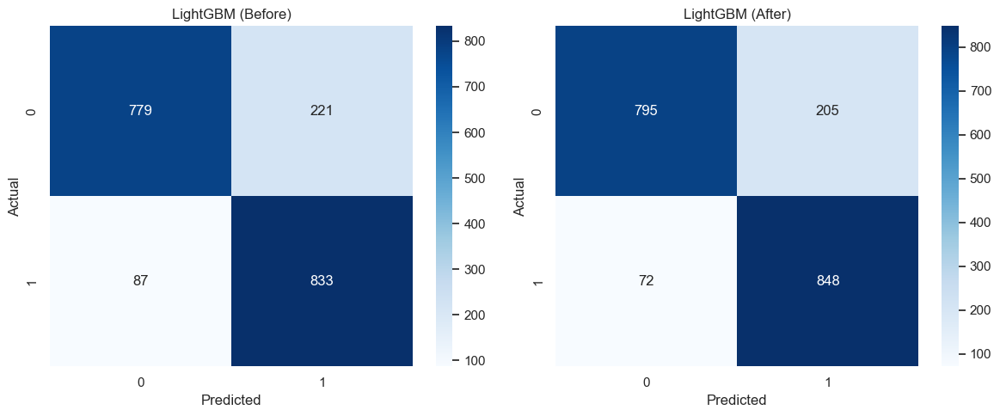


------------------------------------------------------------

########## CatBoost ##########
roc_auc (Before): 0.9079
roc_auc (After): 0.9405
CatBoost best params: {'border_count': 64, 'depth': 6, 'iterations': 1000, 'l2_leaf_reg': 3, 'learning_rate': 0.3}

ROC AUC (Before): 0.9077
ROC AUC (After): 0.9403
Precision for class 0.0 (Before): 0.8974
Precision for class 1.0 (Before): 0.7771
Recall for class 0.0 (Before): 0.7610
Recall for class 1.0 (Before): 0.9054
F1-score for class 0.0 (Before): 0.8236
F1-score for class 1.0 (Before): 0.8363
Precision for class 0.0 (After): 0.9083
Precision for class 1.0 (After): 0.8015
Recall for class 0.0 (After): 0.7920
Recall for class 1.0 (After): 0.9130
F1-score for class 0.0 (After): 0.8462
F1-score for class 1.0 (After): 0.8537


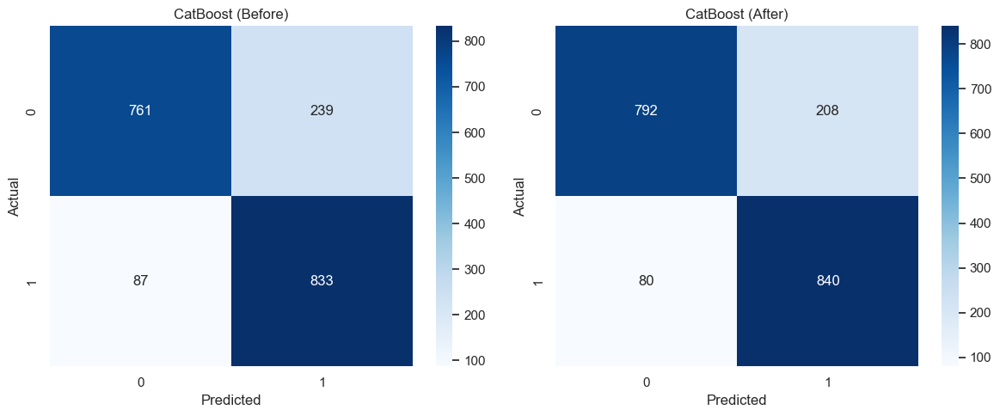


------------------------------------------------------------



In [104]:
# Run hyperparameter optimization results and confusion matrix before after
classifiers = [
    ("RF", RandomForestClassifier(random_state=42, n_jobs=-1), rf_params),
    ('XGBoost', XGBClassifier(random_state=42, eval_metric='logloss', n_jobs=-1), xgboost_params),
    ('LightGBM', LGBMClassifier(random_state=42, n_jobs=-1), lightgbm_params),
    ('CatBoost', CatBoostClassifier(random_state=42, silent=True), catboost_params)
]

def plot_confusion_matrix_before_after(y, y_pred_before, y_pred_after, model_name):
    """
    Hiperparametre optimizasyonu öncesi ve sonrası için confusion matrix çizdirir.

    Args:
    y (array-like): Gerçek etiketler.
    y_pred_before (array-like): Hiperparametre optimizasyonu öncesi tahmin edilen etiketler.
    y_pred_after (array-like): Hiperparametre optimizasyonu sonrası tahmin edilen etiketler.
    model_name (str): Modelin ismi.
    """
   
    cm_before = confusion_matrix(y, y_pred_before)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.heatmap(cm_before, annot=True, fmt=".0f", cmap="Blues")
    plt.title(f'{model_name} (Before)')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    
    cm_after = confusion_matrix(y, y_pred_after)

    plt.subplot(1, 2, 2)
    sns.heatmap(cm_after, annot=True, fmt=".0f", cmap="Blues")
    plt.title(f'{model_name} (After)')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

    plt.tight_layout()
    plt.show()

def hyperparameter_optimization(X, y, cv=5, scoring="roc_auc"):
    print("Hyperparameter Optimization....")
    best_models = {}

    for name, classifier, params in classifiers:
        print(f"########## {name} ##########")

      
        cv_results_before = cross_validate(classifier, X, y, cv=cv, scoring=scoring, return_train_score=False)
        print(f"{scoring} (Before): {round(cv_results_before['test_score'].mean(), 4)}")

   
        gs_best = GridSearchCV(classifier, params, cv=cv, n_jobs=-1, verbose=False)
        gs_best.fit(X, y)

     
        final_model = gs_best.best_estimator_

        
        cv_results_after = cross_validate(final_model, X, y, cv=cv, scoring=scoring, return_train_score=False)
        print(f"{scoring} (After): {round(cv_results_after['test_score'].mean(), 4)}")
        print(f"{name} best params: {gs_best.best_params_}", end="\n\n")

       
        y_pred_before = cross_val_predict(classifier, X, y, cv=cv, method='predict')
        y_pred_proba_before = cross_val_predict(classifier, X, y, cv=cv, method='predict_proba')

        y_pred_after = cross_val_predict(final_model, X, y, cv=cv, method='predict')
        y_pred_proba_after = cross_val_predict(final_model, X, y, cv=cv, method='predict_proba')

        # ROC AUC Skorları
        roc_auc_before = roc_auc_score(y, y_pred_proba_before[:, 1])
        roc_auc_after = roc_auc_score(y, y_pred_proba_after[:, 1])

        print(f"ROC AUC (Before): {roc_auc_before:.4f}")
        print(f"ROC AUC (After): {roc_auc_after:.4f}")

        # Diğer metrikleri hesapla
        precision_before_0 = precision_score(y, y_pred_before, pos_label=0)
        precision_before_1 = precision_score(y, y_pred_before, pos_label=1)
        recall_before_0 = recall_score(y, y_pred_before, pos_label=0)
        recall_before_1 = recall_score(y, y_pred_before, pos_label=1)
        f1_before_0 = f1_score(y, y_pred_before, pos_label=0)
        f1_before_1 = f1_score(y, y_pred_before, pos_label=1)

        precision_after_0 = precision_score(y, y_pred_after, pos_label=0)
        precision_after_1 = precision_score(y, y_pred_after, pos_label=1)
        recall_after_0 = recall_score(y, y_pred_after, pos_label=0)
        recall_after_1 = recall_score(y, y_pred_after, pos_label=1)
        f1_after_0 = f1_score(y, y_pred_after, pos_label=0)
        f1_after_1 = f1_score(y, y_pred_after, pos_label=1)

        # Classification Report
        report_before = classification_report(y, y_pred_before, output_dict=True)
        report_after = classification_report(y, y_pred_after, output_dict=True)

        print(f"Precision for class 0.0 (Before): {precision_before_0:.4f}")
        print(f"Precision for class 1.0 (Before): {precision_before_1:.4f}")
        print(f"Recall for class 0.0 (Before): {recall_before_0:.4f}")
        print(f"Recall for class 1.0 (Before): {recall_before_1:.4f}")
        print(f"F1-score for class 0.0 (Before): {f1_before_0:.4f}")
        print(f"F1-score for class 1.0 (Before): {f1_before_1:.4f}")

        print(f"Precision for class 0.0 (After): {precision_after_0:.4f}")
        print(f"Precision for class 1.0 (After): {precision_after_1:.4f}")
        print(f"Recall for class 0.0 (After): {recall_after_0:.4f}")
        print(f"Recall for class 1.0 (After): {recall_after_1:.4f}")
        print(f"F1-score for class 0.0 (After): {f1_after_0:.4f}")
        print(f"F1-score for class 1.0 (After): {f1_after_1:.4f}")

        # Confusion Matrix (Before & After)
        plot_confusion_matrix_before_after(y, y_pred_before, y_pred_after, name)

        print("\n" + "-" * 60 + "\n")
        best_models[name] = final_model

    return best_models

best_models = hyperparameter_optimization(X, y)


In [105]:
best_models

{'RF': RandomForestClassifier(max_features='log2', n_estimators=500, n_jobs=-1,
                        random_state=42),
 'XGBoost': XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric='logloss',
               feature_types=None, gamma=None, grow_policy=None,
               importance_type=None, interaction_constraints=None,
               learning_rate=0.1, max_bin=None, max_cat_threshold=None,
               max_cat_to_onehot=None, max_delta_step=None, max_depth=8,
               max_leaves=None, min_child_weight=None, missing=nan,
               monotone_constraints=None, multi_strategy=None, n_estimators=100,
               n_jobs=-1, num_parallel_tree=None, random_state=42, ...),
 'LightGBM': LGBMClassifier(force_col_wise=True, learning_rate=0.3, max_depth=20,
                min

Calculating feature importance for RF...
Calculating feature importance for XGBoost...
Calculating feature importance for LightGBM...
Calculating feature importance for CatBoost...


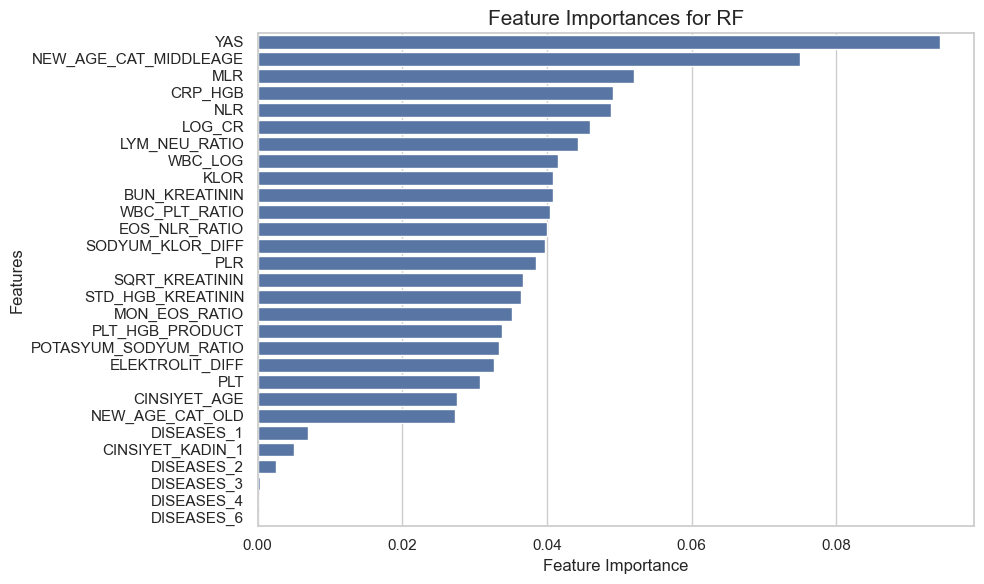

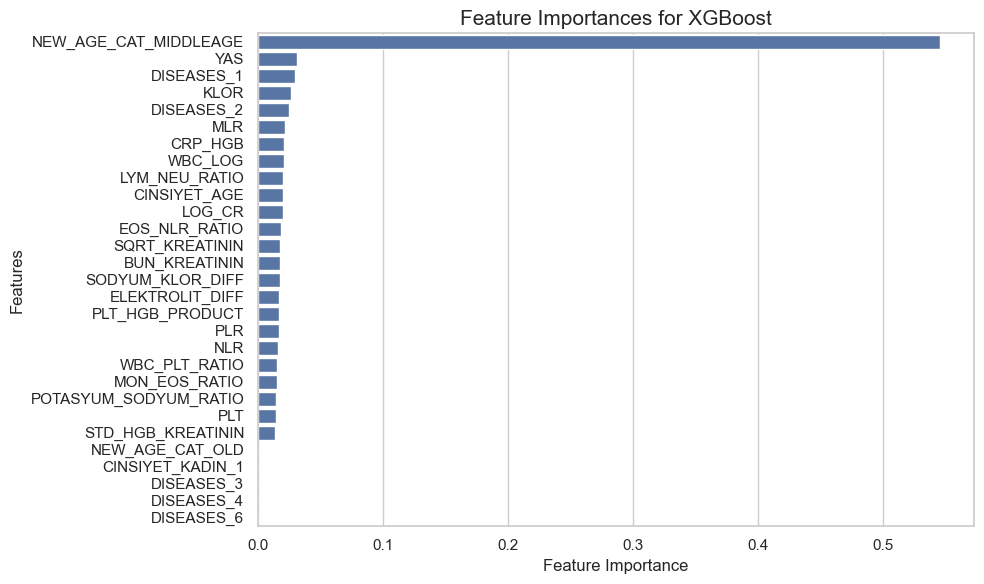

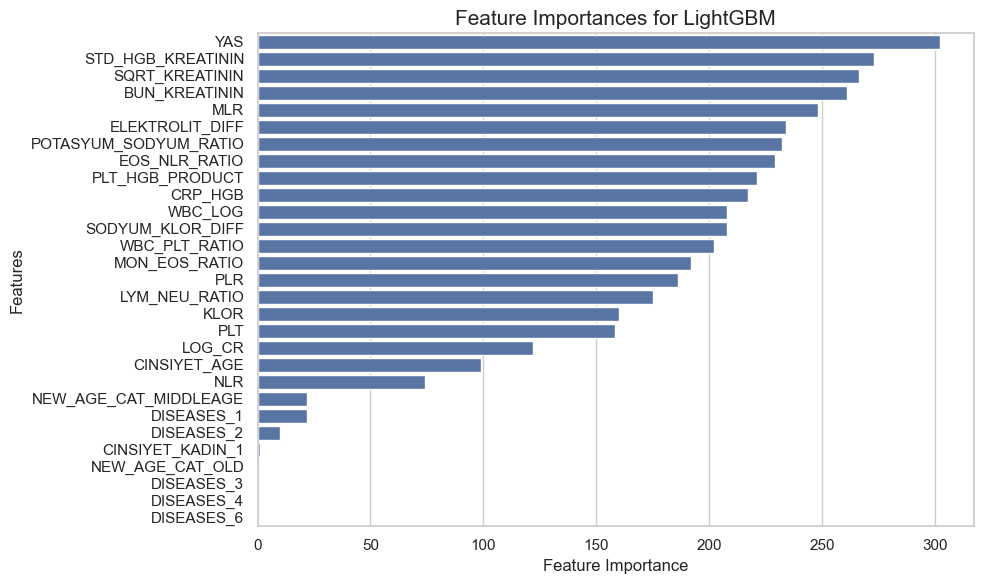

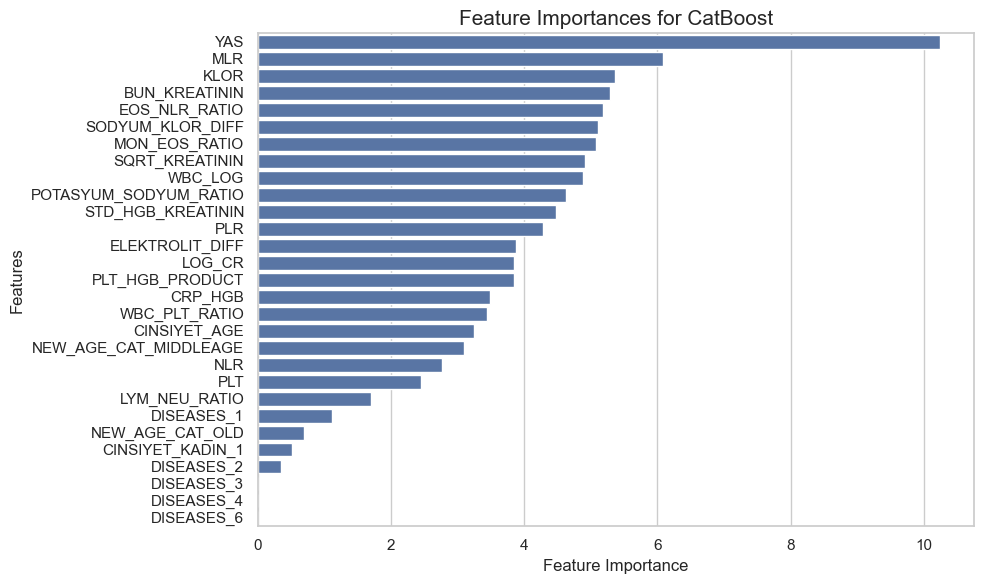

In [183]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def calculate_feature_importance(best_models, X, y):
    feature_importances = {}

    for name, model in best_models.items():
        print(f"Calculating feature importance for {name}...")
        if hasattr(model, 'feature_importances_'):
            model.fit(X, y)
            importances = model.feature_importances_
            feature_importances[name] = importances
        elif hasattr(model, 'coef_'):
            model.fit(X, y)
            importances = model.coef_.flatten()
            feature_importances[name] = importances
        else:
            print(f"Feature importance not available for {name}")

    # Create a DataFrame for feature importances
    feature_importance_df = pd.DataFrame(feature_importances, index=X.columns)
    return feature_importance_df

def plot_feature_importances(feature_importance_df):
    sns.set(style="whitegrid")
    for model in feature_importance_df.columns:
        plt.figure(figsize=(10, 6))
        importances = feature_importance_df[model].sort_values(ascending=False)
        sns.barplot(x=importances, y=importances.index)
        plt.title(f'Feature Importances for {model}', fontsize=15)
        plt.xlabel('Feature Importance', fontsize=12)
        plt.ylabel('Features', fontsize=12)
        plt.tight_layout()
        plt.show()

# Call the functions
feature_importance_df = calculate_feature_importance(best_models, X, y)
plot_feature_importances(feature_importance_df)

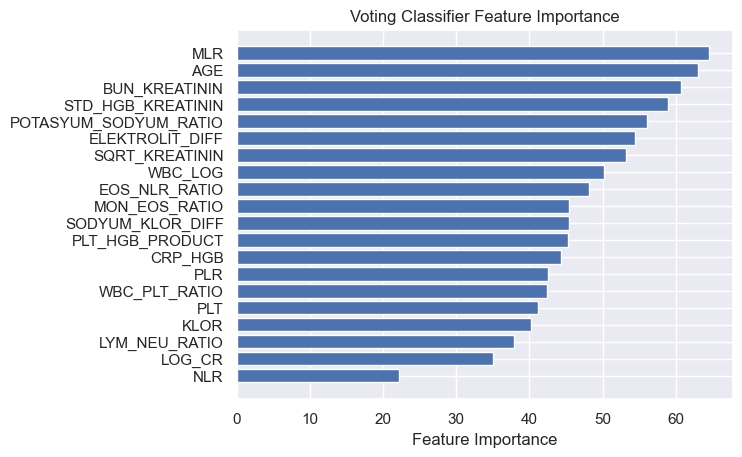

In [106]:
# Feature Importance
def plot_voting_feature_importance(voting_clf, features, num=20):
    feature_importances = []
    for name, model in voting_clf.named_estimators_.items():
        feature_importances.append(model.feature_importances_)
    
    avg_feature_importances = np.mean(feature_importances, axis=0)
    
    sorted_idx = np.argsort(avg_feature_importances)[-num:]
    plt.barh(range(len(sorted_idx)), avg_feature_importances[sorted_idx], align='center')
    plt.yticks(range(len(sorted_idx)), [features[i] for i in sorted_idx])
    plt.xlabel('Feature Importance')
    plt.title('Voting Classifier Feature Importance')
    plt.show()
    
plot_voting_feature_importance(voting_clf, X.columns)